# Non-linear dependencies amongst the SDGs and climate change by distance correlation

We start with investigating dependencies amongst the SDGs on different levels. The method how we investigate these dependencies should take as few assumptions as possible. So, a Pearson linear correlation coefficient or a rank correlation coefficient are not our choice since they assume linearity and/or monotony, respectively.

We choose to compute the [distance correlation](https://projecteuclid.org/euclid.aos/1201012979), precisely the [partial distance correlation](https://projecteuclid.org/download/pdfview_1/euclid.aos/1413810731), because of the following properties:
1. we have an absolute measure of dependence ranging from $0$ to $1$, $0 \leq \mathcal{R}(X,Y) \leq 1$
2. $\mathcal{R}(X,Y) = 0$ if and only if $X$ and $Y$ are independent,
3. $\mathcal{R}(X,Y) = \mathcal{R}(Y,X)$
4. we are able to investigate non-linear and non-monotone relationships,
5. we can find dependencies between indicators with differently many measurements,
6. the only assumptions we need to take is that probability distributions have finite first moments.

The conditional distance correlation has the advantage that we ignore the influence of any other targets or goals when we compute the correlation between any two targets or goals. This procedure is also called controlling for confounders.

The **distance correlation** is defined as:

$$
\mathcal{R}^2(X,Y) = \begin{cases}
\frac{\mathcal{V}^2 (X,Y)}{\sqrt{\mathcal{V}^2 (X)\mathcal{V}^2 (Y)}} &\text{, if $\mathcal{V}^2 (X)\mathcal{V}^2 (Y) > 0$} \\
0 &\text{, if $\mathcal{V}^2 (X)\mathcal{V}^2 (Y) = 0$}
\end{cases}
$$


where


$$
\mathcal{V}^2 (X,Y) = \| f_{X,Y}(t) - f_X(t)f_Y(t) \|^2
$$


is the distance covariance with **characteristic functions** $f(t)$. Bear in mind that characteristic functions include the imaginary unit $i$, $i^2 = -1$:

$$
f_X(t) = \mathbb{E}[e^{itX}]
$$

Thus, we are in the space of complex numbers $\mathbb{C}$. Unfortunately, this means we can most likely not find exact results, but we'll get back to this later under Estimators.

The **conditional distance correlation** is defined as:

$$
\mathcal{R}^2(X,Y \ | \ Z) = \begin{cases}
\frac{\mathcal{R}^2 (X,Y) - \mathcal{R}^2 (X,Z) \mathcal{R}^2 (Y,Z)}{\sqrt{1 - \mathcal{R}^4 (X,Z)} \sqrt{1 - \mathcal{R}^4 (Y,Z)}} &\text{, if $\mathcal{R}^4 (X,Z) \neq 1$ and $\mathcal{R}^4 (Y,Z) \neq 1$} \\
0 &\text{, if $\mathcal{R}^4 (X,Z) = 1$ and $\mathcal{R}^4 (Y,Z) = 1$}
\end{cases}
$$

# Distance covariance
Let's dismantle the distance covariance equation to know what we actually compute in the distance correlation:

$$
\mathcal{V}^2 (X,Y) = \| f_{X,Y}(t) - f_X(t) \ f_Y(t) \|^2 = \frac{1}{c_p c_q} \int_{\mathbb{R}^{p+q}} \frac{| f_{X,Y}(t) - f_X(t)f_Y(t) |^2}{| t |_p^{1+p} \ | t |_q^{1+q}} dt
$$

where

$$
c_d = \frac{\pi^{(1+d)/2}}{\Gamma \Big( (1+d)/2 \Big)}
$$

where the (complete) Gamma function $\Gamma$ is

$$
\Gamma (z) = \int_0^{\infty} x^{z-1} \ e^{-x} \ dx
$$

with $z \in \mathbb{R}^{+}$. 

$p$ and $q$ are the samples of time-series. We can see this as a random vector with multiple samples available for each time point. However, the number of samples for time points must not vary over the same time-series. We can write this as: 

$$X \ \text{in} \ \mathbb{R}^p$$

$$Y \ \text{in} \ \mathbb{R}^q$$


A preliminary conclusion of this formulation: **we can compute dependencies between time-series with different numbers of samples**. 

But we still have some terms in the distance covariance $\mathcal{V}^2 (X,Y)$ which we need to define:

$ | t |_p^{1+p} $ is the Euclidean distance of $t$ in $\mathbb{R}^p$, $ | t |_q^{1+q} $ is the Euclidean distance of $t$ in $\mathbb{R}^q$.

The numerator in the integral of $\mathcal{V}^2 (X,Y)$ is:
$$
| f_{X,Y}(t) - f_X(t) \ f_Y(t) |^2 = \Big( 1- |f_X(t) | ^2 \Big) \ \Big( 1- |f_Y(t) |^2 \Big)
$$

where $|f_X(t) |$ and $|f_Y(t) |$ are absolute random vectors of the characteristic functions $f(t)$ with $p$ and $q$ samples, respectively.


## Estimators

Since the characteristic functions include the imaginary unit $i$, we cannot recover the exact solution for the distance covariance. However, we can estimate it by a quite simple form. We compute these estimators according to [Huo & Szekely, 2016](https://arxiv.org/abs/1410.1503).

We denote the pairwise distances of the $X$ observations by $a_{ij} := \|X_i - X_j \|$ and of the $Y$ observations by $b_{ij} = \|Y_i - Y_j \|$ for $i,j = 1, ..., n$, where $n$ is the number of measurements in $X$ and $Y$. The corresponding distance matrices are denoted by $(A_{ij})^n_{i,j=1}$ and $(B_{ij})^n_{i,j=1}$, where

$$
A_{ij} = \begin{cases}
a_{ij} - \frac{1}{n} \sum_{l=1}^n a_{il} - \frac{1}{n} \sum_{k=1}^n a_{kj} + \frac{1}{n^2} \sum_{k,l=1}^n a_{kl} & i \neq j; \\
0 & i = j.
\end{cases}
$$

and

$$
B_{ij} = \begin{cases}
b_{ij} - \frac{1}{n} \sum_{l=1}^n b_{il} - \frac{1}{n} \sum_{k=1}^n b_{kj} + \frac{1}{n^2} \sum_{k,l=1}^n b_{kl} & i \neq j; \\
0 & i = j.
\end{cases}
$$


Having computed these, we can estimate the sample distance covariance $\hat{\mathcal{V}}^2(X,Y)$ by

$$
\hat{\mathcal{V}}^2(X,Y) = \frac{1}{n^2} \sum_{i,j=1}^n A_{ij} \ B_{ij}
$$

The corresponding sample variance $\hat{\mathcal{V}}^2(X)$ is consequently:

$$
\hat{\mathcal{V}}^2(X) = \frac{1}{n^2} \sum_{i,j=1}^n A^2_{ij}
$$


Then, we can scale these covariances to finally arrive at the sample distance correlation $\hat{\mathcal{R}}^2(X,Y)$:

$$
\hat{\mathcal{R}}^2(X,Y) = \begin{cases}
\frac{\hat{\mathcal{V}}^2 (X,Y)}{\sqrt{\hat{\mathcal{V}}^2 (X)\hat{\mathcal{V}}^2 (Y)}} &\text{, if $\hat{\mathcal{V}}^2 (X)\mathcal{V}^2 (Y) > 0$} \\
0 &\text{, if $\hat{\mathcal{V}}^2 (X)\hat{\mathcal{V}}^2 (Y) = 0$}
\end{cases}
$$

### Unbiased estimators
These estimators are biased, but we can define unbiased estimators of the distance covariance $\hat{\mathcal{V}}^2(X,Y)$ and call them $\Omega_n(x,y)$. We must first redefine our distance matrices $(A_{ij})^n_{i,j=1}$ and $(B_{ij})^n_{i,j=1}$, which we will call $(\tilde{A}_{ij})^n_{i,j=1}$ and $(\tilde{B}_{ij})^n_{i,j=1}$:

$$
\tilde{A}_{ij} = \begin{cases}
a_{ij} - \frac{1}{n-2} \sum_{l=1}^n a_{il} - \frac{1}{n-2} \sum_{k=1}^n a_{kj} + \frac{1}{(n-1)(n-2)} \sum_{k,l=1}^n a_{kl} & i \neq j; \\
0 & i = j.
\end{cases}
$$

and

$$
\tilde{B}_{ij} = \begin{cases}
b_{ij} - \frac{1}{n-2} \sum_{l=1}^n b_{il} - \frac{1}{n-2} \sum_{k=1}^n b_{kj} + \frac{1}{(n-1)(n-2)} \sum_{k,l=1}^n b_{kl} & i \neq j; \\
0 & i = j.
\end{cases}
$$

Finally, we can compute the unbiased estimator $\Omega_n(X,Y)$ for $\mathcal{V}^2(X,Y)$ as the dot product $\langle \tilde{A}, \tilde{B} \rangle$:

$$
\Omega_n(X,Y) = \langle \tilde{A}, \tilde{B} \rangle = \frac{1}{n(n-3)} \sum_{i,j=1}^n \tilde{A}_{ij} \ \tilde{B}_{ij}
$$


Interestingly, [Lyons (2013)](https://arxiv.org/abs/1106.5758) found another solution how not only the sample distance correlation can be computed, but also the population distance correlation without characteristic functions. This is good to acknowledge, but it is not necessary to focus on it. 

# Conditional distance covariance

We start with computing the unbiased distance matrices $(\tilde{A}_{ij})^n_{i,j=1}$, $(\tilde{B}_{ij})^n_{i,j=1}$, and $(\tilde{C}_{ij})^n_{i,j=1}$ for $X$, $Y$, and $Z$, respectively, as we have done previously for the distance covariance. We define the dot product

$$
\Omega_n(X,Y) = \langle \tilde{A}, \tilde{B} \rangle = \frac{1}{n(n-3)} \sum_{i,j=1}^n \tilde{A}_{ij} \tilde{B}_{ij}
$$

and project the sample $x$ onto $z$ as 

$$
P_z (x) = \frac{\langle \tilde{A}, \tilde{C} \rangle}{\langle \tilde{C}, \tilde{C} \rangle} \tilde{C} .
$$

The complementary projection is consequently

$$
P_{z^{\bot}} (x) = \tilde{A} - P_z (x) = \tilde{A} - \frac{\langle \tilde{A}, \tilde{C} \rangle}{\langle \tilde{C}, \tilde{C} \rangle} \tilde{C} .
$$

Hence, the sample conditional distance covariance is

$$
\hat{\mathcal{V}}^2(X,Y \ | \ Z) = \langle P_{z^{\bot}} (x), P_{z^{\bot}} (y) \rangle .
$$

Then, we can scale these covariances to finally arrive at the sample conditional distance correlation $\hat{\mathcal{R}}^2(X,Y \ | \ Z)$:

$$
\hat{\mathcal{R}}^2(X,Y \ | \ Z) = \begin{cases}
\frac{\langle P_{z^{\bot}} (x), P_{z^{\bot}} (y) \rangle}{\| P_{z^{\bot}} (x) \| \ \| P_{z^{\bot}} (y) \|} &\text{, if} \ \| P_{z^{\bot}} (x) \| \ \| P_{z^{\bot}} (y) \| \neq 0 \\
0 &\text{, if} \ \| P_{z^{\bot}} (x) \| \ \| P_{z^{\bot}} (y) \| = 0
\end{cases}
$$

## Implementation
For our computations, we'll use the Python package [`dcor`](https://dcor.readthedocs.io/en/latest/?badge=latest).

In [1]:
import dcor
import numpy as np
import pickle
import itertools
import pandas as pd
import os
import math

import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import matplotlib.image as mpimg

import warnings
warnings.filterwarnings('ignore')

### Loading standardised imputed data set
We load first of all the standardised imputed data set which we have generated with the previous notebook.

In [2]:
indicators_values_i = pickle.load(open('utils/data/indicators_values_i_up_wb.pkl', 'rb'))
targets_values_i = pickle.load(open('utils/data/targets_values_i_up_wb.pkl', 'rb'))
goals_values_i = pickle.load(open('utils/data/goals_values_i_up_wb.pkl', 'rb'))

In [3]:
# check whether T appended
targets_values_i['Belgium'].index

Index(['1.3', '1.1', '1.2', '2.3', '2.2', '2.1', '3.5', '3.3', '3.2', '3.4',
       '3.7', '3.8', '3.c', '3.a', '3.1', '3.6', '3.9', '4.6', '4.1', '4.5',
       '4.2', '4.c', '4.4', '4.3', '5.5', '5.1', '5.2', '5.3', '5.4', '5.6',
       '6.4', '6.2', '6.1', '7.1', '7.3', '7.2', '8.1', '8.3', '8.10', '8.2',
       '8.5', '8.7', '8.6', '9.4', '9.5', '9.1', '9.2', '9.b', '10.b', '10.1',
       '10.c', '11.6', '11.1', '12.2', '13.1', '13.2', '14.4', '14.5', '15.1',
       '15.5', '16.5', '16.9', '16.1', '16.6', '17.3', '17.2', '17.4', '17.1',
       '17.17', '17.6', '17.19', '17.18', '17.8', '17.11', '17.13', '17.12',
       'T'],
      dtype='object')

Unfortunately, our temperature data is available from 1991 to 2016 only. Additionally, SDG 13 has data from 2005 to 2019 only. Thus, we can only compute the distance covariances for the 12-dimensional random vectors from 2005 to 2016.

In [24]:
period = ['2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016']

In [25]:
# read amended csv file
c = pd.read_csv('utils/countries_wb.csv', dtype=str, delimiter=';', header=None)
countries = list(c[0])
continents = pd.read_csv(r'utils/continents.csv')
groups = pd.read_csv(r'utils/groups.csv')
groups.replace({"Democratic People's Republic of Korea": "Korea, Dem. People's Rep.", 'Gambia': 'Gambia, The', 'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom', 'Congo': 'Congo, Rep.', 'Democratic Republic of the Congo': 'Congo, Dem. Rep.', 'Czechia': 'Czech Republic', 'Iran (Islamic Republic of)': 'Iran, Islamic Rep.', "Côte d'Ivoire": "Cote d'Ivoire", 'Kyrgyzstan': 'Kyrgyz Republic', "Lao People's Democratic Republic": 'Lao PDR', 'Republic of Moldova': 'Moldova', 'Micronesia (Federated States of)': 'Micronesia, Fed. Sts.', 'Slovakia': 'Slovak Republic', 'Viet Nam': 'Vietnam', 'Egypt': 'Egypt, Arab Rep.', 'United Republic of Tanzania': 'Tanzania','United States of America': 'United States', 'Venezuela (Bolivarian Republic of)': 'Venezuela, RB', 'Yemen': 'Yemen, Rep.', 'Bahamas': 'Bahamas, The', 'Bolivia (Plurinational State of)': 'Bolivia'}, inplace=True)
continents.replace({"Democratic People's Republic of Korea": "Korea, Dem. People's Rep.", 'Gambia': 'Gambia, The', 'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom', 'Congo': 'Congo, Rep.', 'Democratic Republic of the Congo': 'Congo, Dem. Rep.', 'Czechia': 'Czech Republic', 'Iran (Islamic Republic of)': 'Iran, Islamic Rep.', "Côte d'Ivoire": "Cote d'Ivoire", 'Kyrgyzstan': 'Kyrgyz Republic', "Lao People's Democratic Republic": 'Lao PDR', 'Republic of Moldova': 'Moldova', 'Micronesia (Federated States of)': 'Micronesia, Fed. Sts.', 'Slovakia': 'Slovak Republic', 'Viet Nam': 'Vietnam', 'Egypt': 'Egypt, Arab Rep.', 'United Republic of Tanzania': 'Tanzania','United States of America': 'United States', 'Venezuela (Bolivarian Republic of)': 'Venezuela, RB', 'Yemen': 'Yemen, Rep.', 'Bahamas': 'Bahamas, The', 'Bolivia (Plurinational State of)': 'Bolivia'}, inplace=True)
info = pd.read_csv(r'utils/wb_info.csv')

We later compute the correlations on an indicator level, but this is too detailed for any network visualisation and for an overarching understanding. Hence, we group here all sub-indicators first on an indicator-level. Then, we compute the distance correlations for the indicators, targets and goals.

We work with the `info` file again, so we don't need to assign all of this by hand.

In [26]:
# check
info['Series Code'].shape

(379,)

We first generate a list of all unique **indicators**.

In [ ]:
# UN data set only
indicators = list(info['Indicator'].unique())
indicators

We also generate a dictionary with lists of series codes, i.e. sub-indicators, belonging to each indicator. Each indicator has one list, consequently.

In [ ]:
# UN data set only
dict_indicators = {}

for indicator in indicators:
    i = info['SeriesCode'].where(info['Indicator'] == indicator)

    dict_indicators[indicator] = list(set([s for s in i if str(s) != 'nan']))

In [ ]:
#check 
print(dict_indicators['1.1.1'])

We calculate the averages of all sub-indicators in every given year to have values for indicators:

In [29]:
targets_values_i['France'].tail()

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
17.8,[-2.0993945289098144],[-1.5634034130795944],[-1.3915141668177768],[-1.1257035102836281],[-0.9914602089131941],[-0.8255515440965778],[-0.6471551303152699],[0.21003963790391472],[0.41474952271796567],[0.45488871581875956],[0.7091036054571234],[0.7331870762725056],[0.8946358757896835],[0.9160345256227512],[0.9976598047483889],[0.7416609509722123],[0.797847406354486]
17.11,[0.12913071956320843],[-0.06712958655530575],[-0.5053856684660272],[-1.3517152349838368],[-1.1388821924620411],[-0.8023887123806653],[-0.2644401788822193],[-0.3132236497347006],[-0.15450727166791817],[-2.1129637210677994],[-0.9483565161603563],[0.025575034470178473],[0.49176898795922386],[0.5882120398732893],[0.7682907741606207],[1.3205132676000353],[1.114707013432549]
17.13,"[-2.0325317567027437, -1.8058092756131767, -1....","[-2.003954514184022, -1.5739170179412005, -1.5...","[-1.7671144870187698, -1.3808686097217506, -1....","[-1.0712079569910333, -1.2142399316726953, -1....","[-0.5178872452753612, -0.9289091797308606, -0....","[-0.3563031117219831, -0.6881831165204619, -0....","[-0.11012343257809647, -0.3682601000902121, -0...","[0.5705570008611844, -0.005692869605481348, 0....","[1.0955504346050442, 0.19276629312913615, 0.21...","[0.6369105259987008, -0.024900853642791054, -0...","[0.5412011891151937, 0.20408181065941844, 0.06...","[0.9810219837507651, 0.4494523317354606, 0.413...","[0.6240513978166429, 0.567839329340872, 0.4651...","[0.8798496089606491, 0.6782521739943826, 0.560...","[0.9624432380304578, 0.8049672991461447, 0.719...","[0.1303206417073838, 0.9942736902242637, 0.905...","[0.19681221726305803, 1.1331289770164557, 1.09..."
17.12,"[-1.1926755202624046, -0.1268677251238139, -1....","[-3.2448499984467025, -2.250941001817972, -3.5...","[0.23016545127870916, -0.3556140779985702, 0.1...","[0.42170173590924376, -0.06151162430245588, 0....","[0.31225243040608114, 0.4613371822684133, 0.05...","[0.3669770831576625, -0.6170384812840052, -0.0...","[0.17544079852712782, -0.9438189853907973, -0....","[0.4764263886608251, -0.6497165316946838, 0.35...","[0.7500496524187311, 1.0168640392499626, 0.729...","[0.7226873260429405, 0.9841859888392832, 0.603...","[-0.12554479160656945, -0.9111409349801187, 0....","[0.8868612842976844, 1.3763225937674348, 0.855...","[0.8594989579218938, 1.474356744999473, 0.8344...","[0.8868612842976844, 1.5723908962315112, 0.918...","[-0.7001536454981727, -0.5190043300519663, -0....","[-0.6180666663708001, -0.48632627964128766, -0...","[-0.20763177073394085, 0.03652252692958222, 0...."
T,[-0.7034590820617685],[0.2514889603249052],[-0.659835879009625],[-0.7241210163556984],[0.31930075677221315],[0.3860017146897854],[-0.7580370438060705],[-0.20655129531368024],[0.41361061030568014],[-0.31242366114220504],[1.8558521150835532],[-1.5840383419076944],[-0.0003877675765452289],[0.9244967299203215],[-1.9436326431042235],[-1.2621534635662528],[-0.4532283535014818]


We would like to have values for targets, so we must, first of all, generate a list of all unique **targets**.

In [30]:
targets = list(info['target'].unique())    # T for UN data set

Exactly as with the series codes, we need lists of indicators.

In [31]:
dict_targets = {}

for target in targets:
    t = info['Series Code'].where(info['target'] == target)    # replace Series Code with Indicator for UN data set

    dict_targets[target] = list(set([i for i in t if str(i) != 'nan']))

In [32]:
#check 
dict_targets['1.2']

['SI.POV.NAHC', 'SI.POV.URHC', 'SI.POV.RUHC']

Finally we also generate a list of all unique **goals**.

In [33]:
goals = list(info['SDG'].unique())    # replace SDG with Goal for UN data set
goals

['1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 'T']

And as above, lists of targets belonging to each goal.

In [34]:
dict_goals = {}

for goal in goals:
    g = info['target'].where(info['SDG'] == goal)

    dict_goals[goal] = list(set([t for t in g if str(t) != 'nan']))

In [35]:
#check 
print(dict_goals['13'])

['13.1', '13.2']


## Distance correlations between targets

We start with computing the distance correlations between targets. Before, we have multiplied all indicators which are meant to decrease over time by -1, as e.g. child mortality. Doing so, we circumvent the issue that some targets are measured by multiple indicators, of wich some are meant to increase and other are meant to decrease. E.g. target 1.5, *by 2030, build the resilience of the poor and those in vulnerable situations and reduce their exposure and vulnerability to climate-related extreme events and other economic, social and environmental shocks and disasters*, has the indicator 1.5.1, *number of deaths, missing persons and directly affected persons attributed to disasters*, which is meant to **decrease**. On the other hand, indicator 1.5.3, *number of countries that adopt and implement national disaster risk reduction strategies in line with the Sendai Framework for Disaster Risk Reduction 2015–2030* is meant to **increase**. 

In [36]:
if not os.path.exists('distance_cor'):
    os.mkdir('distance_cor')

The next step is to compute the distance correlations on a target-level by seeing the sub-indicators as samples for targets. 

We work with the **concatenated time-series** to compute the conditioned distance correlation directly on target-level data. Visually speaking, this means that we fit one non-linear function to the data for all indicators of these two targets.

### Working with concatenated time-series

### Conditioning iteratively on subsets of joint distributions of all goals
We condition pairs of two targets iteratively on subsets of all remaining targets. We start with conditioning on the empty set, i.e. we compute the pairwise distance correlation first. Afterwards, we increase the set to condition on until we have reached the set of all remaining targets to condition on. These sets are represented by the joint distributions of the targets entailed in them.

In [ ]:
# create sublists from the given list to condition on  
def sub_lists(list_condition):  
    sublist = []     
    # first loop  
    for i in range(len(list_condition)+1):          
        # second loop  
        for j in np.arange(i+1, len(list_condition)+1):             
            # slice the subarray  
            sub = list_condition[i:j] 
            sublist.append(sub)      
    return sublist

We need to condition on all **subsets** of these lists of targets we condition on to find the dependence which solely stems from either of the two targets we condition the others on:

In [ ]:
# create list out of all unique combinations of three goals
t_combinations = list(itertools.combinations(targets, 2))
conditions_t = sub_lists(targets)

In [ ]:
pairs = list(itertools.product(t_combinations, conditions_t))

pairs_t = pd.DataFrame(index=range(len(pairs)), columns=['pair_0', 'pair_1', 'condition'])

for i in range(len(pairs)):
    pairs_t.loc[i, 'pair_0'] =  pairs[i][0][0]
    pairs_t.loc[i, 'pair_1'] =  pairs[i][0][1]
    pairs_t.loc[i, 'condition'] =  pairs[i][1]
    
    if (pairs_t.loc[i, 'pair_0'] in pairs_t.loc[i, 'condition'] or pairs_t.loc[i, 'pair_1'] in pairs_t.loc[i, 'condition']):
        pairs_t.drop(i, inplace=True)

# adding for pairwise correlation
for i in range(len(t_combinations)):
    pairs_t = pairs_t.append({'pair_0' : t_combinations[i][0], 'pair_1' : t_combinations[i][1]} , ignore_index=True)

pairs_t.fillna(0, inplace=True)

In [ ]:
# check
pairs_t.tail()

### Continents

In [ ]:
# data preparation
continents_prep_t = {}
continents_prep_boot_t = {}

for continent in continents:
    print(continent)
    
    continents_prep_t[continent] = pd.DataFrame(columns=period, index=targets)
    continents_prep_boot_t[continent] = pd.DataFrame(columns=period, index=targets)
    
    for target in targets:
        max_year_t = 0
        
        for year in period:
            y_t = []

            for country in continents[continent].dropna():
                y_t.extend(targets_values_i[country].loc[str(target), year])
            
            continents_prep_t[continent].loc[target, year] = y_t
    
            # finding year with most measurements
            len_year_t = len(y_t)
            if len_year_t > max_year_t:
                max_year_t = len_year_t
                
        # bootstrap to have same number of samples in each year
        for year in period:
            # not considering the years without samples
            if len(continents_prep_t[continent].loc[target, year]) == 0:
                continue    
            else:
                continents_prep_boot_t[continent].loc[target, year] = np.random.choice(continents_prep_t[continent].loc[target, year], size=max_year_t, replace=True).tolist()

In [ ]:
# check
continents_prep_g['Europe'].loc['13.1']

--------------------------------------------------
#### Partial distance covariance interlude

In [ ]:
A = np.array([[1], [2], [3], [2], [1]])
B = np.multiply(A, A)
C = np.multiply(B, B)

In [ ]:
print(dcor.u_distance_correlation_sqr(A, C))
print(dcor.partial_distance_correlation(A, C, B)**2)

We see that $A$ and $B$ are pairwise dependent, but $A$ is independent of $C$ given $B$.

------------------------------------

In [ ]:
# continents
# have conditions in joint random vector
dict_cov_targets_continents_2 = {}
dict_cor_targets_continents_2 = {}

for continent in continents:
    print(continent)
    
    dict_cov_toa_c = pairs_t.copy()
    dict_cor_toa_c = pairs_t.copy()
    
    for i, row in pairs_t.iterrows():
        #print(row)
        
        if row['condition'] == 0:            
            # pairwise distance correlation
            dict_cov_toa_c.loc[i, 'dcov'] = dcor.distance_covariance(np.array(continents_prep_boot_t[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_t[continent].loc[row['pair_1']].to_list()))
            dict_cor_toa_c.loc[i, 'dcor'] = dcor.distance_correlation(np.array(continents_prep_boot_t[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_t[continent].loc[row['pair_1']].to_list()))
        
        else:
            # partial distance correlation
            condition = pd.DataFrame(index=period, columns=row['condition'] + ['combined'])
            for y in period:
                condition.loc[y, 'combined'] = []
            for c in row['condition']:
                condition[c] = continents_prep_boot_t[continent].loc[c]
                for y in period:
                    condition.loc[y, 'combined'].extend(condition.loc[y, c])
                    
            # square partial distance correlation to range [0, 1]    
            dict_cov_toa_c.loc[i, 'dcov'] = dcor.partial_distance_covariance(np.array(continents_prep_boot_t[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_t[continent].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
            dict_cor_toa_c.loc[i, 'dcor'] = dcor.partial_distance_correlation(np.array(continents_prep_boot_t[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_t[continent].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
        
        """
        if dict_cov_toa_c.loc[i, 'dcov'] < 0:
            dict_cov_toa_c.loc[i, 'dcov'] = 0
        if dict_cor_toa_c.loc[i, 'dcor'] < 0:
            dict_cor_toa_c.loc[i, 'dcor'] = 0 
        """
    
    # find minimum distance correlation between any two targets
    dict_cov_toa_con = dict_cov_toa_c.groupby(['pair_0', 'pair_1'])['dcov'].apply(list).reset_index(name='list_dcov')
    dict_cor_toa_con = dict_cor_toa_c.groupby(['pair_0', 'pair_1'])['dcor'].apply(list).reset_index(name='list_dcor')
    
    for i, row in dict_cov_toa_con.iterrows():
        dict_cov_toa_con.loc[i, 'min_dcov'] = min(dict_cov_toa_con.loc[i, 'list_dcov'])
        dict_cor_toa_con.loc[i, 'min_dcor'] = min(dict_cor_toa_con.loc[i, 'list_dcor'])
    
    dict_cov_targets_continents_2[continent] = dict_cov_toa_con
    dict_cor_targets_continents_2[continent] = dict_cor_toa_con

In [ ]:
# CHECKPOINT
dict_cov_targets_continents_2 = pickle.load(open('distance_cor/targets/dict_cov_targets_continents_2.pkl', 'rb'))
dict_cor_targets_continents_2 = pickle.load(open('distance_cor/targets/dict_cor_targets_continents_2.pkl', 'rb'))

In [ ]:
# save
t_cov = open('distance_cor/targets/dict_cov_targets_continents_2.pkl', 'wb')
pickle.dump(dict_cov_targets_continents_2, t_cov)
t_cov.close()

t_cor = open('distance_cor/targets/dict_cor_targets_continents_2.pkl', 'wb')
pickle.dump(dict_cor_targets_continents_2, t_cor)
t_cor.close()

We want to keep the minimum distance correlation of each pair of two targets, pairwise or conditioned on any potential subset.

The last step is to insert these values into the right cell in a matrix.

In [ ]:
for continent in continents:
    for i, row in dict_cov_targets_continents_2[continent].iterrows():
        dict_cov_targets_continents_2[continent].loc[i, 'max_dcov'] = max(dict_cov_targets_continents_2[continent].loc[i, 'list_dcov'])
        dict_cor_targets_continents_2[continent].loc[i, 'max_dcor'] = max(dict_cor_targets_continents_2[continent].loc[i, 'list_dcor'])
        dict_cov_targets_continents_2[continent].loc[i, 'avg_dcov'] = np.mean(dict_cov_targets_continents_2[continent].loc[i, 'list_dcov'])
        dict_cor_targets_continents_2[continent].loc[i, 'avg_dcor'] = np.mean(dict_cor_targets_continents_2[continent].loc[i, 'list_dcor'])

In [ ]:
# check
dict_cor_targets_continents_2['Europe'][dict_cor_targets_continents_2['Europe']['pair_0'] == '1.2']

In [ ]:
cov_targets_continents_2 = {}
cor_targets_continents_2 = {}

for continent in continents:
    cov_targets_continents_2[continent] = pd.DataFrame(index=targets, columns=targets)
    cor_targets_continents_2[continent] = pd.DataFrame(index=targets, columns=targets)

    for i in list(dict_cov_targets_continents_2[continent].index):
        target_0 = dict_cov_targets_continents_2[continent].loc[i, 'pair_0']
        target_1 = dict_cov_targets_continents_2[continent].loc[i, 'pair_1']
        
        # sqrt because squared distance correlations were previously computed
        cov_targets_continents_2[continent].loc[target_1, target_0] = np.sqrt(dict_cov_targets_continents_2[continent].loc[i, 'min_dcov'])
        cor_targets_continents_2[continent].loc[target_1, target_0] = np.sqrt(dict_cor_targets_continents_2[continent].loc[i, 'min_dcor'])

In [ ]:
# check
cor_targets_continents_2['Europe']

In [ ]:
# save
"""
if not os.path.exists('distance_cor/targets'):
    os.mkdir('distance_cor/targets')

for continent in continents:
    cov_targets_continents_2[continent].to_csv(r'distance_cor/targets/{}_dcov_targets.csv'.format(continent))
    cor_targets_continents_2[continent].to_csv(r'distance_cor/targets/{}_dcor_targets.csv'.format(continent))
"""
t_cov = open('distance_cor/targets/dcov_targets_continents_2.pkl', 'wb')
pickle.dump(cov_targets_continents_2, t_cov)
t_cov.close()

t_cor = open('distance_cor/targets/dcor_targets_continents_2.pkl', 'wb')
pickle.dump(cor_targets_continents_2, t_cor)
t_cor.close()

## Visualisation on target-level
Additionally to the matrices with numbers, we would also like to visualise these matrices and plot these correlations as networks.

In [ ]:
# continents
for continent in continents:
    # generate a mask for the upper triangle
    mask = np.zeros_like(cor_targets_continents_2[continent].fillna(0), dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # set up the matplotlib figure
    f, ax = plt.subplots(figsize=(25, 22))

    # generate a custom diverging colormap
    cmap = sns.color_palette("Reds", 100)

    # draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(cor_targets_continents_2[continent].fillna(0), mask=mask, cmap=cmap, vmax=1, center=0.5, vmin=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .8})
    
    plt.title('{}'.format(continent), fontdict={'fontsize': 52})
    plt.savefig('distance_cor/targets/{}_cor_targets.png'.format(continent))

In [ ]:
# data preparation for networkX
dcor_dict_t = {}

for continent in cor_targets_continents_2.keys():
    dcor_dict_t[continent] = {}

    for targetcombination in g_combinations:
        dcor_dict_t[continent][targetcombination] = cor_targets_continents_2[continent].loc[targetcombination[1], targetcombination[0]]

In [ ]:
for continent in cor_targets_continents_2.keys():
    for key in dcor_dict_t[continent].keys():
        if key[1] == 'T':
            dcor_dict_t[continent][tuple((key[0], '888'))] = dcor_dict_t[continent].pop(tuple((key[0], 'T')))
        elif key[0] == 'T':
            dcor_dict_t[continent][tuple(('888', key[1]))] = dcor_dict_t[continent].pop(tuple(('T', key[1])))

In [ ]:
# plotting networks with weighted edges

centrality_C = {}     # dictionary to save centralities
density_C = {}    # dictionary to save weighted densities

for continent in cor_targets_continents_2.keys():
    T_C = nx.Graph()

    for key, value in dcor_dict_g[continent].items():
        T_C.add_edge(int(key[0]), int(key[1]), weight=value, color=sns.color_palette("Reds", 100)[int(np.around(value*100))], alpha=value)
        
    pos = nx.circular_layout(T_C)
    
    plt.figure(figsize=(24,16))

    # nodes
    nx.draw_networkx_nodes(T_C, pos, node_size=1000)

    # labels
    nx.draw_networkx_labels(T_C, pos, font_size=46, font_family='sans-serif')

    nodes = T_C.nodes()
    edges = T_C.edges()
    colors = [T_C[u][v]['color'] for u,v in edges]
    weights = [T_C[u][v]['weight'] for u,v in edges]

    nx.draw_networkx(T_C, pos, with_labels=False, edges=edges, edge_color=colors, node_color='white', node_size=1000, width=np.multiply(weights,20))

    ax=plt.gca()
    fig=plt.gcf()
    trans = ax.transData.transform
    trans_axes = fig.transFigure.inverted().transform
    imsize = 0.08    # this is the image size
    plt.title('{}'.format(continent), fontdict={'fontsize': 52})
    
    """
    for node in T_C.nodes():
        (x,y) = pos[node]   
        xx,yy = trans((x,y)) # figure coordinates
        xa,ya = trans_axes((xx,yy)) # axes coordinates
        a = plt.axes([xa-imsize/2.0,ya-imsize/2.0, imsize, imsize])
        a.imshow(mpimg.imread('utils/images/E_SDG targets_icons-individual-rgb-{}.png'.format(node)))
        a.axis('off')
    """

    plt.axis('off')
    ax.axis('off')
    
    plt.savefig('distance_cor/targets/{}_circular_network_logos.png'.format(continent), format='png')

    plt.show()
    
    # centrality
    centr = nx.eigenvector_centrality(T_C, weight='weight')
    centrality_C[continent] = sorted((v, '{:0.2f}'.format(c)) for v, c in centr.items())
    
    # weighted density
    density_C[continent] = 2 * np.sum(weights) / (len(nodes) * (len(nodes) - 1))

In [ ]:
for continent in continents:
    print(continent)
    print(centrality_C[continent])
    print('-------------------------')

In [ ]:
for continent in continents:
    print(continent)
    print(density_C[continent])
    print('-------------------------')

### Groups

In [ ]:
# data preparation
groups_prep_t = {}
groups_prep_boot_t = {}

for group in groups:
    print(group)
    
    groups_prep_t[group] = pd.DataFrame(columns=period, index=targets)
    groups_prep_boot_t[group] = pd.DataFrame(columns=period, index=targets)
    
    for target in targets:
        max_year_t = 0
        
        for year in period:
            y_t = []

            for country in groups[group].dropna():
                y_t.extend(targets_values_i[country].loc[str(target), year])
            
            groups_prep_t[group].loc[target, year] = y_t
    
            # finding year with most measurements
            len_year_t = len(y_t)
            if len_year_t > max_year_t:
                max_year_t = len_year_t
                
        # bootstrap to have same number of samples in each year
        for year in period:
            # not considering the years without samples
            if len(groups_prep_t[group].loc[target, year]) == 0:
                continue    
            else:
                groups_prep_boot_t[group].loc[target, year] = np.random.choice(groups_prep_t[group].loc[target, year], size=max_year_t, replace=True).tolist()

In [ ]:
# groups
# have conditions in joint random vector
dict_cov_targets_groups_2 = {}
dict_cor_targets_groups_2 = {}

for group in groups:
    print(group)
    
    dict_cov_toa_g = pairs_g.copy()
    dict_cor_toa_g = pairs_g.copy()
    
    for i, row in pairs_t.iterrows():
        #print(row)
        
        if row['condition'] == 0:            
            # pairwise distance correlation
            dict_cov_toa_g.loc[i, 'dcov'] = dcor.distance_covariance(np.array(groups_prep_boot_t[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_t[group].loc[row['pair_1']].to_list()))
            dict_cor_toa_g.loc[i, 'dcor'] = dcor.distance_correlation(np.array(groups_prep_boot_t[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_t[group].loc[row['pair_1']].to_list()))
        
        else:
            # partial distance correlation
            condition = pd.DataFrame(index=period, columns=row['condition'] + ['combined'])
            for y in period:
                condition.loc[y, 'combined'] = []
            for c in row['condition']:
                condition[c] = groups_prep_boot_t[group].loc[c]
                for y in period:
                    condition.loc[y, 'combined'].extend(condition.loc[y, c])
                    
            # square partial distance correlation to range [0, 1]    
            dict_cov_toa_g.loc[i, 'dcov'] = dcor.partial_distance_covariance(np.array(groups_prep_boot_t[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_t[group].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
            dict_cor_toa_g.loc[i, 'dcor'] = dcor.partial_distance_correlation(np.array(groups_prep_boot_t[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_t[group].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
        
        """
        if dict_cov_toa_g.loc[i, 'dcov'] < 0:
            dict_cov_toa_g.loc[i, 'dcov'] = 0
        if dict_cor_toa_g.loc[i, 'dcor'] < 0:
            dict_cor_toa_g.loc[i, 'dcor'] = 0 
        """
    
    # find minimum distance correlation between any two targets
    dict_cov_toa_gr = dict_cov_toa_g.groupby(['pair_0', 'pair_1'])['dcov'].apply(list).reset_index(name='list_dcov')
    dict_cor_toa_gr = dict_cor_toa_g.groupby(['pair_0', 'pair_1'])['dcor'].apply(list).reset_index(name='list_dcor')
    
    for i, row in dict_cov_toa_con.iterrows():
        dict_cov_toa_gr.loc[i, 'min_dcov'] = min(dict_cov_toa_gr.loc[i, 'list_dcov'])
        dict_cor_toa_gr.loc[i, 'min_dcor'] = min(dict_cor_toa_gr.loc[i, 'list_dcor'])
    
    dict_cov_targets_groups_2[group] = dict_cov_toa_gr
    dict_cor_targets_groups_2[group] = dict_cor_toa_gr

In [ ]:
# CHECKPOINT
dict_cov_targets_groups_2 = pickle.load(open('distance_cor/targets/dict_cov_targets_groups_2.pkl', 'rb'))
dict_cor_targets_groups_2 = pickle.load(open('distance_cor/targets/dict_cor_targets_groups_2.pkl', 'rb'))

In [ ]:
# save
t_cov = open('distance_cor/targets/dict_cov_targets_groups_2.pkl', 'wb')
pickle.dump(dict_cov_targets_groups_2, t_cov)
t_cov.close()

t_cor = open('distance_cor/targets/dict_cor_targets_groups_2.pkl', 'wb')
pickle.dump(dict_cor_targets_groups_2, t_cor)
t_cor.close()

In [ ]:
for group in groups:
    for i, row in dict_cov_targets_groups_2[group].iterrows():
        dict_cov_targets_groups_2[group].loc[i, 'max_dcov'] = max(dict_cov_targets_groups_2[group].loc[i, 'list_dcov'])
        dict_cor_targets_groups_2[group].loc[i, 'max_dcor'] = max(dict_cor_targets_groups_2[group].loc[i, 'list_dcor'])
        dict_cov_targets_groups_2[group].loc[i, 'avg_dcov'] = np.mean(dict_cov_targets_groups_2[group].loc[i, 'list_dcov'])
        dict_cor_targets_groups_2[group].loc[i, 'avg_dcor'] = np.mean(dict_cor_targets_groups_2[group].loc[i, 'list_dcor'])

In [ ]:
cov_targets_groups_2 = {}
cor_targets_groups_2 = {}

for group in groups:
    cov_targets_groups_2[group] = pd.DataFrame(index=targets, columns=targets)
    cor_targets_groups_2[group] = pd.DataFrame(index=targets, columns=targets)

    for i in list(dict_cov_targets_groups_2[group].index):
        target_0 = dict_cov_targets_groups_2[group].loc[i, 'pair_0']
        target_1 = dict_cov_targets_groups_2[group].loc[i, 'pair_1']
        
        # sqrt because squared distance correlations were previously computed
        cov_targets_groups_2[group].loc[target_1, target_0] = np.sqrt(dict_cov_targets_groups_2[group].loc[i, 'min_dcov'])
        cor_targets_groups_2[group].loc[target_1, target_0] = np.sqrt(dict_cor_targets_groups_2[group].loc[i, 'min_dcor'])

In [ ]:
# save
"""
if not os.path.exists('distance_cor/targets'):
    os.mkdir('distance_cor/targets')

for group in groups:
    cov_targets_groups_2[group].to_csv(r'distance_cor/targets/{}_dcov_targets.csv'.format(group))
    cor_targets_groups_2[group].to_csv(r'distance_cor/targets/{}_dcor_targets.csv'.format(group))
"""    
t_cov = open('distance_cor/targets/dcov_targets_groups_2.pkl', 'wb')
pickle.dump(cov_targets_groups_2, t_cov)
t_cov.close()

t_cor = open('distance_cor/targets/dcor_targets_groups_2.pkl', 'wb')
pickle.dump(cor_targets_groups_2, t_cor)
t_cor.close()

## Visualisation on target-level
Additionally to the matrices with numbers, we would also like to visualise these matrices and plot these correlations as networks.

In [ ]:
# groups
for group in groups:
    # generate a mask for the upper triangle
    mask = np.zeros_like(cor_targets_groups_2[group].fillna(0), dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # set up the matplotlib figure
    f, ax = plt.subplots(figsize=(25, 22))

    # generate a custom diverging colormap
    cmap = sns.color_palette("Reds", 100)

    # draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(cor_targets_groups_2[group].fillna(0), mask=mask, cmap=cmap, vmax=1, center=0.5, vmin=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .8})
    
    plt.title('{}'.format(group), fontdict={'fontsize': 52})
    plt.savefig('distance_cor/targets/{}_cor_targets.png'.format(group))

In [ ]:
# data preparation for networkX
dcor_dict_t = {}

for group in cor_targets_groups_2.keys():
    dcor_dict_t[group] = {}

    for targetcombination in t_combinations:
        dcor_dict_t[group][targetcombination] = cor_targets_groups_2[group].loc[targetcombination[1], targetcombination[0]]

In [ ]:
for group in cor_targets_groups_2.keys():
    for key in dcor_dict_t[group].keys():
        if key[1] == 'T':
            dcor_dict_t[group][tuple((key[0], '888'))] = dcor_dict_g[group].pop(tuple((key[0], 'T')))
        elif key[0] == 'T':
            dcor_dict_t[group][tuple(('888', key[1]))] = dcor_dict_g[group].pop(tuple(('T', key[1])))

In [ ]:
# plotting networks with weighted edges

centrality_G = {}
density_G = {}

for group in cor_targets_groups_2.keys():
    T_G = nx.Graph()

    for key, value in dcor_dict_t[group].items():
        T_G.add_edge(int(key[0]), int(key[1]), weight=value, color=sns.color_palette("Reds", 100)[int(np.around(100*value))], alpha=value)
        
    pos = nx.circular_layout(T_G)
    
    plt.figure(figsize=(24,16))

    # nodes
    nx.draw_networkx_nodes(T_G, pos, node_size=1000)

    # labels
    nx.draw_networkx_labels(T_G, pos, font_size=46, font_family='sans-serif')

    nodes = T_G.nodes()
    edges = T_G.edges()
    colors = [T_G[u][v]['color'] for u,v in edges]
    weights = [T_G[u][v]['weight'] for u,v in edges]

    nx.draw_networkx(T_G, pos, with_labels=False, edges=edges, edge_color=colors, node_color='white', node_size=1000, width=np.multiply(weights,20))

    ax=plt.gca()
    fig=plt.gcf()
    trans = ax.transData.transform
    trans_axes = fig.transFigure.inverted().transform
    imsize = 0.08    # this is the image size
    plt.title('{}'.format(group), fontdict={'fontsize': 52})

    for node in T_G.nodes():
        (x,y) = pos[node]   
        xx,yy = trans((x,y)) # figure coordinates
        xa,ya = trans_axes((xx,yy)) # axes coordinates
        a = plt.axes([xa-imsize/2.0,ya-imsize/2.0, imsize, imsize])
        a.imshow(mpimg.imread('utils/images/E_SDG targets_icons-individual-rgb-{}.png'.format(node)))
        a.axis('off')


    plt.axis('off')
    ax.axis('off')
    
    plt.savefig('distance_cor/targets/{}_circular_network_logos.png'.format(group), format='png')

    plt.show()
    
    # centrality
    centr = nx.eigenvector_centrality(T_G, weight='weight')
    centrality_G[group] = sorted((v, '{:0.2f}'.format(c)) for v, c in centr.items())
    
    # weighted density
    density_G[group] = 2 * np.sum(weights) / (len(nodes) * (len(nodes) - 1))

In [ ]:
for group in groups:
    print(group)
    print(centrality_G[group])
    print('-------------------------')

In [ ]:
for group in groups:
    print(group)
    print(density_G[group])
    print('-------------------------')

## Distance correlations between goals

The next step is to compute the distance correlations on a goal-level.

We can take multiple approaches here. Firstly, we can work with the **concatenated time-series** to compute the conditioned distance correlation directly on goal-level data. Visually speaking, this means that we fit one non-linear function to the data for all targets of these two goals. Since goals often have diverse targets, this may end up in fitting a non-linear curve to very noisy data. A second approach is taking the **maximum distance correlation** between any two targets of two goals as the distance correlation of these two goals. 

### 1. Working with concatenated time-series

### Conditioning iteratively on subsets of joint distributions of all goals
We condition pairs of two goals iteratively on subsets of all remaining goals. We start with conditioning on the empty set, i.e. we compute the pairwise distance correlation first. Afterwards, we increase the set to condition on until we have reached the set of all remaining 15 goals to condition on. These sets are represented by the joint distributions of the goals entailed in them.

In [37]:
# create sublists from the given list to condition on  
def sub_lists(list_condition):  
    sublist = []     
    # first loop  
    for i in range(len(list_condition)+1):          
        # second loop  
        for j in np.arange(i+1, len(list_condition)+1):             
            # slice the subarray  
            sub = list_condition[i:j] 
            sublist.append(sub)      
    return sublist

We need to condition on all **subsets** of these lists of SDGs we condition on to find the dependence which solely stems from either of the two SDGs we condition the others on:

In [38]:
# create list out of all unique combinations of three goals
g_combinations = list(itertools.combinations(goals, 2))
conditions_g = sub_lists(goals)

In [39]:
pairs = list(itertools.product(g_combinations, conditions_g))

pairs_g = pd.DataFrame(index=range(len(pairs)), columns=['pair_0', 'pair_1', 'condition'])

for i in range(len(pairs)):
    pairs_g.loc[i, 'pair_0'] =  pairs[i][0][0]
    pairs_g.loc[i, 'pair_1'] =  pairs[i][0][1]
    pairs_g.loc[i, 'condition'] =  pairs[i][1]
    
    if (pairs_g.loc[i, 'pair_0'] in pairs_g.loc[i, 'condition'] or pairs_g.loc[i, 'pair_1'] in pairs_g.loc[i, 'condition']):
        pairs_g.drop(i, inplace=True)

# adding for pairwise correlation
for i in range(len(g_combinations)):
    pairs_g = pairs_g.append({'pair_0' : g_combinations[i][0], 'pair_1' : g_combinations[i][1]} , ignore_index=True)

pairs_g.fillna(0, inplace=True)

In [40]:
# check
pairs_g.tail()

,pair_0,pair_1,condition
11776,15,17,0
11777,15,T,0
11778,16,17,0
11779,16,T,0
11780,17,T,0


For the dcor computations, we need the same number of samples in each year. We bootstrap the under-represented years to the same number of samples of the year with the maximum samples. We need bootstrapped data for all goals, so we can call them afterwards when conditioning.

In [41]:
# check
goals_values_i['France']

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
1,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-1.136802058192633, -1.136802058192633, -1.13...","[-0.4401874132377565, -0.4401874132377564, -0....","[-0.06820920720254942, -0.06820920720254897, -...","[-0.9575706688498763, -0.9575706688498766, -0....","[0.6758059737838076, 0.6555187193134803, 0.687...","[0.2901848657437458, 0.004675993270351758, -0....","[-0.3679973231724517, -0.5380736219104216, 0.0...","[-0.8926485986515077, -0.8637649406180499, -1....","[0.45220969355105484, 0.40757581765213563, 0.0...","[0.0875445575744741, 0.1353180818003819, 0.247...","[-0.3045805514718551, -0.2808860890829486, -0....","[-0.019945484185149256, 0.08867793139567251, 0...","[-1.1753416857523549, -0.7982147093542651, -1....","[0.1343161514658213, -0.06505308186416552, -0....","[1.1370569824292134, 1.5579180388815979, 1.267...","[1.3087153932562101, 0.12034998509504886, 1.46..."
2,"[0.46929914406376516, 0.35485360547240447, -0....","[-0.5549661195721478, 0.5136039026574268, -1.1...","[0.9209709654759783, 0.6723541998424493, -0.60...","[-1.7864090674314497, 0.6723541998424493, -1.0...","[1.0549431490731898, 0.7517293484349619, -0.65...","[-0.07331878676147219, 0.7517293484349619, -0....","[-0.40957469353742604, 0.6723541998424493, -0....","[-0.9803329003693821, 0.6723541998424493, 0.04...","[0.5127330483350077, 0.5929790512499381, 0.329...","[0.8381814578040324, 0.5136039026574268, 0.741...","[0.1371215381583505, 0.35485360547240447, 1.05...","[-0.16732362182739893, 0.11672815969486942, 1....","[0.5161996040749657, -0.2007724346751768, 1.03...","[0.1701557752097174, -0.5976481776377343, 0.79...","[1.1310034603087455, -1.2326493663778253, 1.59...","[1.1595515664025198, -1.8676505551179177, 1.16...","[-2.680984363384216, -2.740777189635545, 1.180..."
3,"[2.3094010767585034, -0.0, -0.0, -1.3014033318...","[2.3094010767585034, -0.0, -0.0, -1.2196622961...","[2.3094010767585034, -0.0, -0.0, -1.1787917782...","[-0.4330127018922193, -0.0, -0.0, -1.219662296...","[-0.4330127018922193, -0.0, -0.0, -0.933568671...","[-0.4330127018922193, -0.0, -0.0, -0.933568671...","[-0.4330127018922193, -0.0, -0.0, -0.770086599...","[-0.4330127018922193, -0.0, -0.0, -0.647475046...","[-0.4330127018922193, -0.0, -0.0, -0.443122456...","[-0.4330127018922193, -0.0, -0.0, -0.279640385...","[0.9999999999999956, -0.0, 1.000000000000005, ...","[-0.4330127018922193, -0.0, -0.0, 0.6603815254...","[-0.4330127018922193, -0.0, -0.0, 0.8238635968...","[-0.4330127018922193, -0.0, -0.0, 0.9873456682...","[-0.4330127018922193, -0.0, -0.0, 1.0282161861...","[-0.4330127018922193, -0.0, -0.0, 1.2325687754...","[-1.0000000000000044, -0.0, -0.999999999999994..."
4,"[-1.1142724277984182, -0.4495231128617195, -0....","[-1.7183389592018963, 0.22921167888438004, -1....","[-0.9382449550452319, -0.9927619471046943, -0....","[-0.9146877385489125, -0.4855151289345308, -0....","[-1.465482833590378, -1.0150121711984148, -1.4...","[-1.1231998230776206, -1.1768012528258596, -0....","[-1.3755245890182395, -0.9234213124800817, -1....","[-0.9060475352287584, -0.2801149453611516, -0....","[-0.5618524012155772, -0.02004744047105053, -0...","[-0.21773818449621812, -0.08488629100593292, -...","[-0.3174721683041396, 0.21338192992862867, -0....","[0.20475564032654528, -0.12671033158939868, 0....","[0.2571073388656155, 0.2006271254074774, 0.310...","[0.7219569802004864, -0.04268888926172218, 0.5...","[0.7580681858203991, 0.2400101470222516, 0.590...","[1.0329767828035759, 0.17678579168608055, 1.03...","[0.9931003674727871, 0.13848754451985376, 0.90..."
5,"[-1.1019623457841408, -1.174884757427274, -1.1...","[-1.1019623457841408, -0.8417086620907933, -1....","[-0.9751116752540464, -0.1272306196146967, -0....","[-0.9645407860432053, -0.8491127479208506, -0....","[-0.9574000988743672, -0.9645407860432053, -0....","[-1.4648552514128474, -0.9645407860432053, 0.5...","[-0.5525273931355608, -0.9645407860432053, 0.8...","[-1

### Continents

In [44]:
# data preparation
continents_prep_g = {}
continents_prep_boot_g = {}

for continent in continents:
    print(continent)
    
    continents_prep_g[continent] = pd.DataFrame(columns=period, index=goals)
    continents_prep_boot_g[continent] = pd.DataFrame(columns=period, index=goals)
    
    for goal in goals:
        max_year_g = 0
        
        for year in period:
            y_g = []

            for country in continents[continent].dropna():
                y_g.extend(goals_values_i[country].loc[str(goal), year])
            
            continents_prep_g[continent].loc[goal, year] = y_g
    
            # finding year with most measurements
            len_year_g = len(y_g)
            if len_year_g > max_year_g:
                max_year_g = len_year_g
                
        # bootstrap to have same number of samples in each year
        for year in period:
            # not considering the years without samples
            if len(continents_prep_g[continent].loc[goal, year]) == 0:
                continue    
            else:
                continents_prep_boot_g[continent].loc[goal, year] = np.random.choice(continents_prep_g[continent].loc[goal, year], size=max_year_g, replace=True).tolist()

Europe
Asia
Africa
North America
South America
Oceania
Northern Africa
Southern Africa
Northern Europe
Southern Europe
East Asia
West Asia
Caribbean
Middle East


Now we call these data in our `dcor` computations. We first compute the pairwise distance covariance and correlation, then the partial ones with conditioning on all the previously defined sets in `pairs_g`.

In [45]:
# check
continents_prep_g['Europe'].loc['13']

2005    [0.69656371920326, -0.6867155743201147, 0.6965...
2006    [1.4458762456280305, 0.46726535582703643, 1.44...
2007    [1.4458762456280305, 0.44236824838049593, 1.44...
2008    [-0.715776860906459, 0.4622859343377283, -0.71...
2009    [0.8191784962545862, 0.07389105817169689, -0.0...
2010    [-0.2752719211294726, -3.414193695088624, -0.2...
2011    [-1.5332087079152992, 0.3104135789138314, -1.5...
2012    [0.4967470454899878, 0.2519053764144613, 0.496...
2013    [0.33780196412715785, -0.16263146257043765, 0....
2014    [0.33326067608821985, 0.36518721529622045, 0.3...
2015    [-0.14357456800027038, 0.47348963268867156, -0...
2016    [-1.406052642825035, 0.5344875459326958, -0.21...
Name: 13, dtype: object

In [46]:
# continents
# have conditions in joint random vector
dict_cov_goals_continents_2 = {}
dict_cor_goals_continents_2 = {}

for continent in continents:
    print(continent)
    
    dict_cov_goa_c = pairs_g.copy()
    dict_cor_goa_c = pairs_g.copy()
    
    for i, row in pairs_g.iterrows():
        #print(row)
        
        if row['condition'] == 0:            
            # pairwise distance correlation
            dict_cov_goa_c.loc[i, 'dcov'] = dcor.distance_covariance(np.array(continents_prep_boot_g[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_g[continent].loc[row['pair_1']].to_list()))
            dict_cor_goa_c.loc[i, 'dcor'] = dcor.distance_correlation(np.array(continents_prep_boot_g[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_g[continent].loc[row['pair_1']].to_list()))
        
        else:
            # partial distance correlation
            condition = pd.DataFrame(index=period, columns=row['condition'] + ['combined'])
            for y in period:
                condition.loc[y, 'combined'] = []
            for c in row['condition']:
                condition[c] = continents_prep_boot_g[continent].loc[c]
                for y in period:
                    condition.loc[y, 'combined'].extend(condition.loc[y, c])
                    
            # square partial distance correlation to range [0, 1]    
            dict_cov_goa_c.loc[i, 'dcov'] = dcor.partial_distance_covariance(np.array(continents_prep_boot_g[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_g[continent].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
            dict_cor_goa_c.loc[i, 'dcor'] = dcor.partial_distance_correlation(np.array(continents_prep_boot_g[continent].loc[row['pair_0']].to_list()), np.array(continents_prep_boot_g[continent].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
        
        """
        if dict_cov_goa_c.loc[i, 'dcov'] < 0:
            dict_cov_goa_c.loc[i, 'dcov'] = 0
        if dict_cor_goa_c.loc[i, 'dcor'] < 0:
            dict_cor_goa_c.loc[i, 'dcor'] = 0 
        """
    
    # find minimum distance correlation between any two goals
    dict_cov_goa_con = dict_cov_goa_c.groupby(['pair_0', 'pair_1'])['dcov'].apply(list).reset_index(name='list_dcov')
    dict_cor_goa_con = dict_cor_goa_c.groupby(['pair_0', 'pair_1'])['dcor'].apply(list).reset_index(name='list_dcor')
    
    for i, row in dict_cov_goa_con.iterrows():
        dict_cov_goa_con.loc[i, 'min_dcov'] = min(dict_cov_goa_con.loc[i, 'list_dcov'])
        dict_cor_goa_con.loc[i, 'min_dcor'] = min(dict_cor_goa_con.loc[i, 'list_dcor'])
    
    dict_cov_goals_continents_2[continent] = dict_cov_goa_con
    dict_cor_goals_continents_2[continent] = dict_cor_goa_con

Europe
Asia
Africa
North America
South America
Oceania
Northern Africa
Southern Africa
Northern Europe
Southern Europe
East Asia
West Asia
Caribbean
Middle East


In [ ]:
# CHECKPOINT
dict_cov_goals_continents_2 = pickle.load(open('distance_cor/goals/dict_cov_goals_continents_2.pkl', 'rb'))
dict_cor_goals_continents_2 = pickle.load(open('distance_cor/goals/dict_cor_goals_continents_2.pkl', 'rb'))

In [47]:
# save
g_cov = open('distance_cor/goals/dict_cov_goals_continents_2.pkl', 'wb')
pickle.dump(dict_cov_goals_continents_2, g_cov)
g_cov.close()

g_cor = open('distance_cor/goals/dict_cor_goals_continents_2.pkl', 'wb')
pickle.dump(dict_cor_goals_continents_2, g_cor)
g_cor.close()

We want to keep the minimum distance correlation of each pair of two goals, pairwise or conditioned on any potential subset.

The last step is to insert these values into the right cell in a matrix.

In [48]:
for continent in continents:
    for i, row in dict_cov_goals_continents_2[continent].iterrows():
        dict_cov_goals_continents_2[continent].loc[i, 'max_dcov'] = max(dict_cov_goals_continents_2[continent].loc[i, 'list_dcov'])
        dict_cor_goals_continents_2[continent].loc[i, 'max_dcor'] = max(dict_cor_goals_continents_2[continent].loc[i, 'list_dcor'])
        dict_cov_goals_continents_2[continent].loc[i, 'avg_dcov'] = np.mean(dict_cov_goals_continents_2[continent].loc[i, 'list_dcov'])
        dict_cor_goals_continents_2[continent].loc[i, 'avg_dcor'] = np.mean(dict_cor_goals_continents_2[continent].loc[i, 'list_dcor'])

In [49]:
# check
dict_cor_goals_continents_2['Europe'][dict_cor_goals_continents_2['Europe']['pair_0'] == '1']

,pair_0,pair_1,list_dcor,min_dcor,max_dcor,avg_dcor
0,1,10,"[0.0057025546244949534, 0.008891643451786321, ...",1.436706e-11,0.884420,0.019745
1,1,11,"[0.07401074672016647, 0.06862757190978434, 0.0...",6.716014e-06,0.946697,0.057479
2,1,12,"[0.111517608803133, 0.11127008195754587, 0.129...",8.393541e-02,0.971335,0.136432
3,1,13,"[5.665271417856957e-06, 3.570575465638034e-07,...",1.745407e-08,0.904197,0.012193
4,1,14,"[0.0019769433450938546, 0.0017819069462441826,...",1.687583e-07,0.973568,0.013050
5,1,15,"[0.07073544711979006, 0.05773731266598186, 0.0...",8.192668e-04,0.951549,0.047689
6,1,16,"[0.04090718866105944, 0.03362021646828391, 0.0...",4.521891e-04,0.927514,0.060030
7,1,17,"[0.001615153060145535, 0.0006092006528815689, ...",1.239056e-04,0.958981,0.049059
8,1,2,"[0.003569938909138817, 0.028068279760992347, 0...",4.107438e-06,0.906052,0.022764
9,1,3,"[0.11064514254817327, 0.19966436851499475, 0.1...",8.863746e-03,0.975829,0.104984


In [50]:
cov_goals_continents_2 = {}
cor_goals_continents_2 = {}

for continent in continents:
    cov_goals_continents_2[continent] = pd.DataFrame(index=goals, columns=goals)
    cor_goals_continents_2[continent] = pd.DataFrame(index=goals, columns=goals)

    for i in list(dict_cov_goals_continents_2[continent].index):
        goal_0 = dict_cov_goals_continents_2[continent].loc[i, 'pair_0']
        goal_1 = dict_cov_goals_continents_2[continent].loc[i, 'pair_1']
        
        # sqrt because squared distance correlations were previously computed
        cov_goals_continents_2[continent].loc[goal_1, goal_0] = np.sqrt(dict_cov_goals_continents_2[continent].loc[i, 'min_dcov'])
        cor_goals_continents_2[continent].loc[goal_1, goal_0] = np.sqrt(dict_cor_goals_continents_2[continent].loc[i, 'min_dcor'])

In [51]:
# check
cor_goals_continents_2['Europe']

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,T
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.00202668,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0941475,0.220678,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.115216,0.0294478,0.632307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.00046655,0.297964,0.217521,0.100718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0.41689,0.00137745,0.115298,0.673851,0.0159597,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.00343822,0.149813,0.175935,0.110172,0.0167728,0.245193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0.0680939,0.0201279,5.37234e-05,0.0107864,9.11047e-05,0.00302041,0.0111443,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.0268537,0.00314047,0.246034,0.0032101,0.149825,0.242172,0.00665921,0.085779,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,3.79039e-06,0.321152,0.13443,0.00227066,0.073801,0.000610308,0.00298588,0.0017634,0.0151803,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In `cor_goals_continents_2` are the conditional distance correlations for all continents in a setting of 18 random vectors $X$, $Y$, and $Z_1, Z_2, ..., Z_{16}$, where $\boldsymbol{Z}$ is the array containing all random vectors we want to condition on.

In [52]:
# save
"""
if not os.path.exists('distance_cor/goals'):
    os.mkdir('distance_cor/goals')

for continent in continents:
    cov_goals_continents_2[continent].to_csv(r'distance_cor/goals/{}_dcov_goals.csv'.format(continent))
    cor_goals_continents_2[continent].to_csv(r'distance_cor/goals/{}_dcor_goals.csv'.format(continent))
"""
g_cov = open('distance_cor/goals/dcov_goals_continents_2.pkl', 'wb')
pickle.dump(cov_goals_continents_2, g_cov)
g_cov.close()

g_cor = open('distance_cor/goals/dcor_goals_continents_2.pkl', 'wb')
pickle.dump(cor_goals_continents_2, g_cor)
g_cor.close()

## Visualisation on goal-level
Additionally to the matrices with numbers, we would also like to visualise these matrices and plot these correlations as networks.

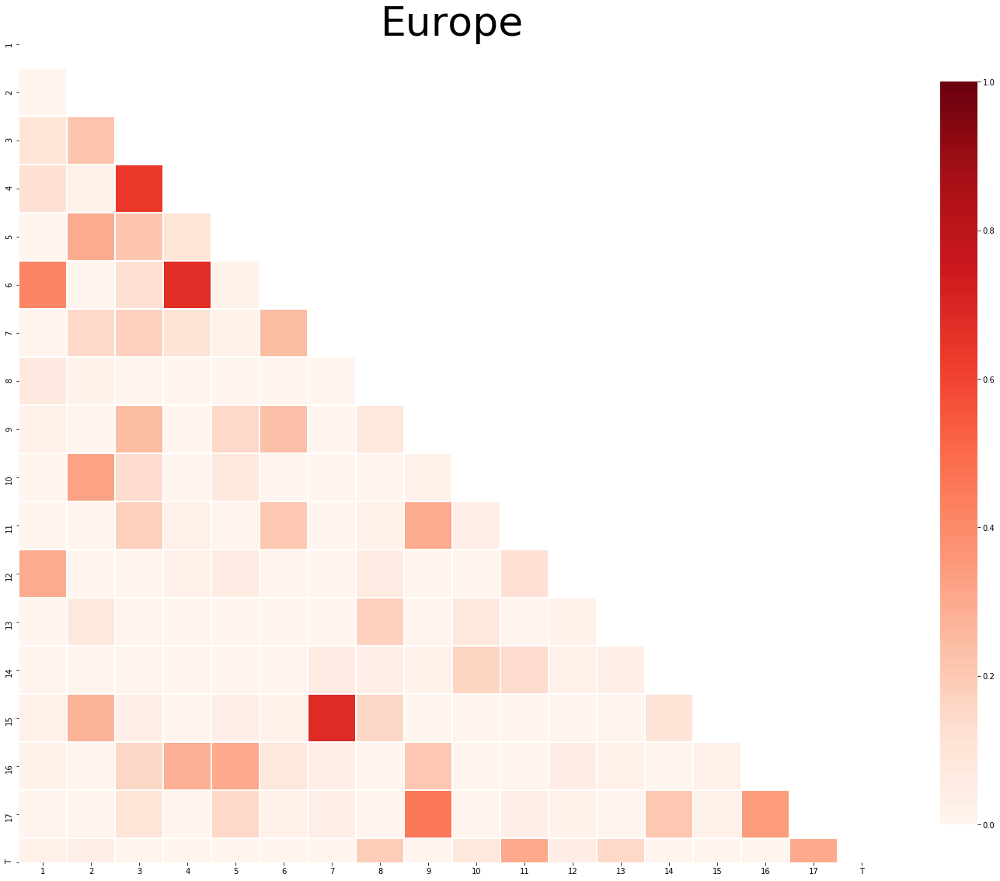

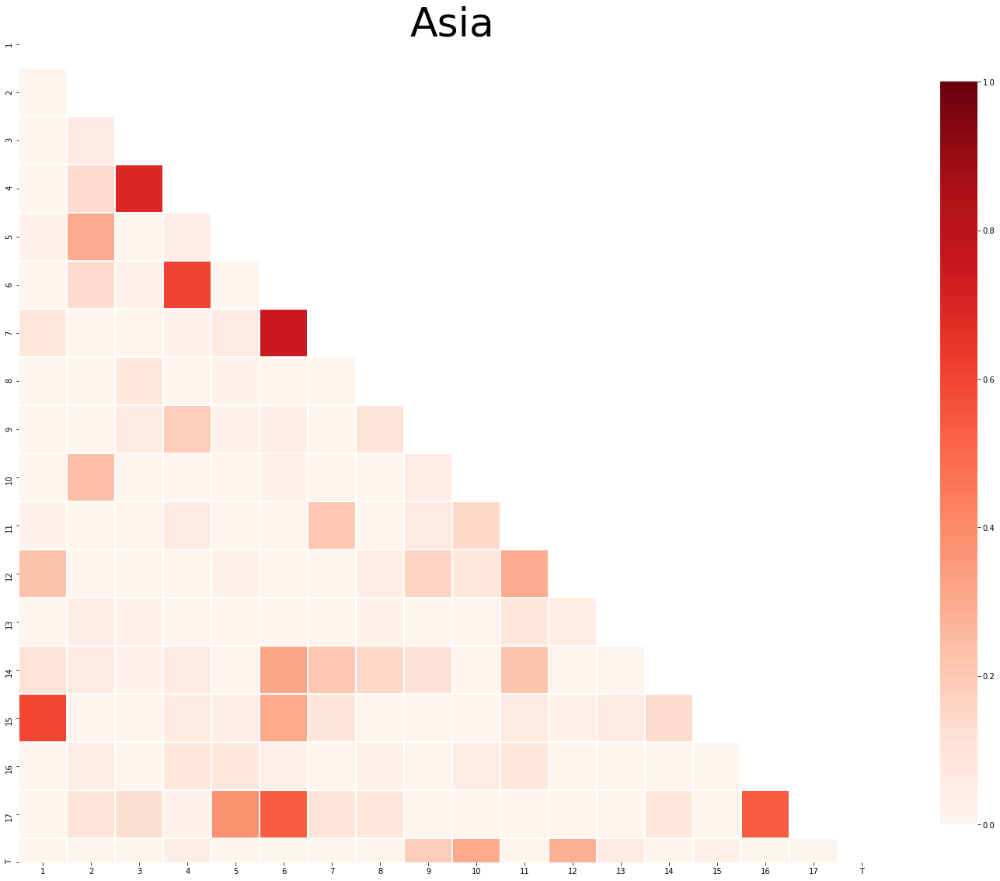

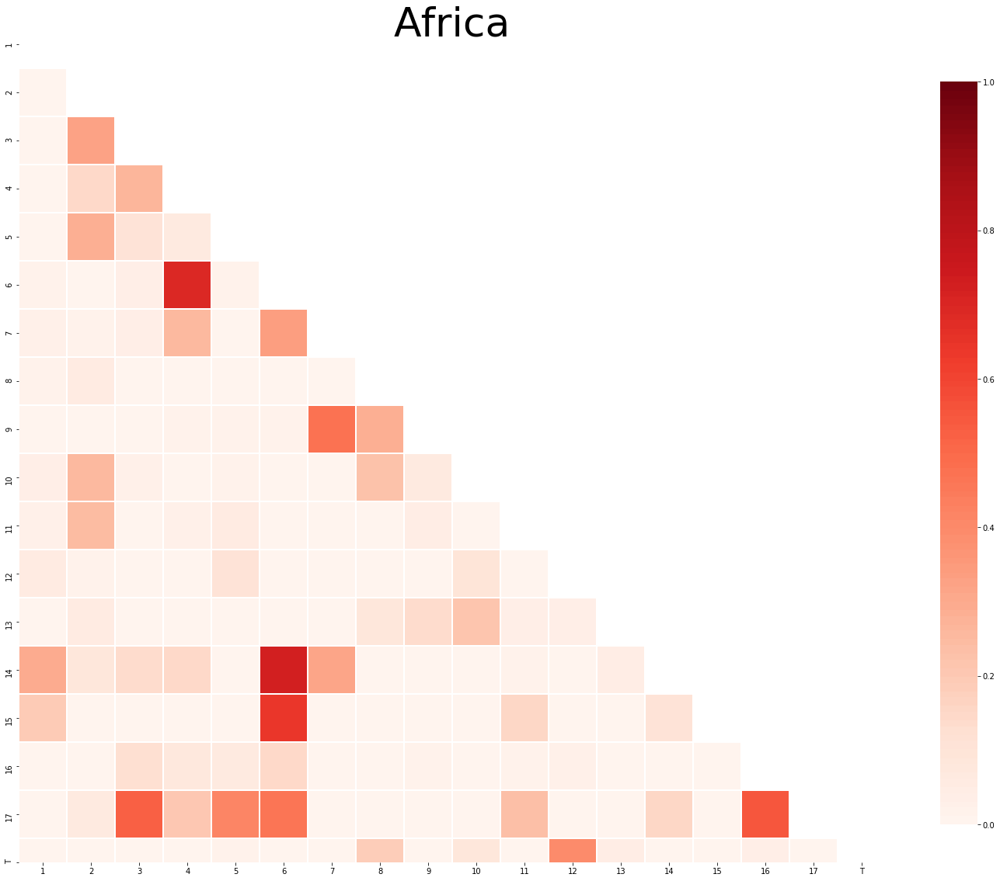

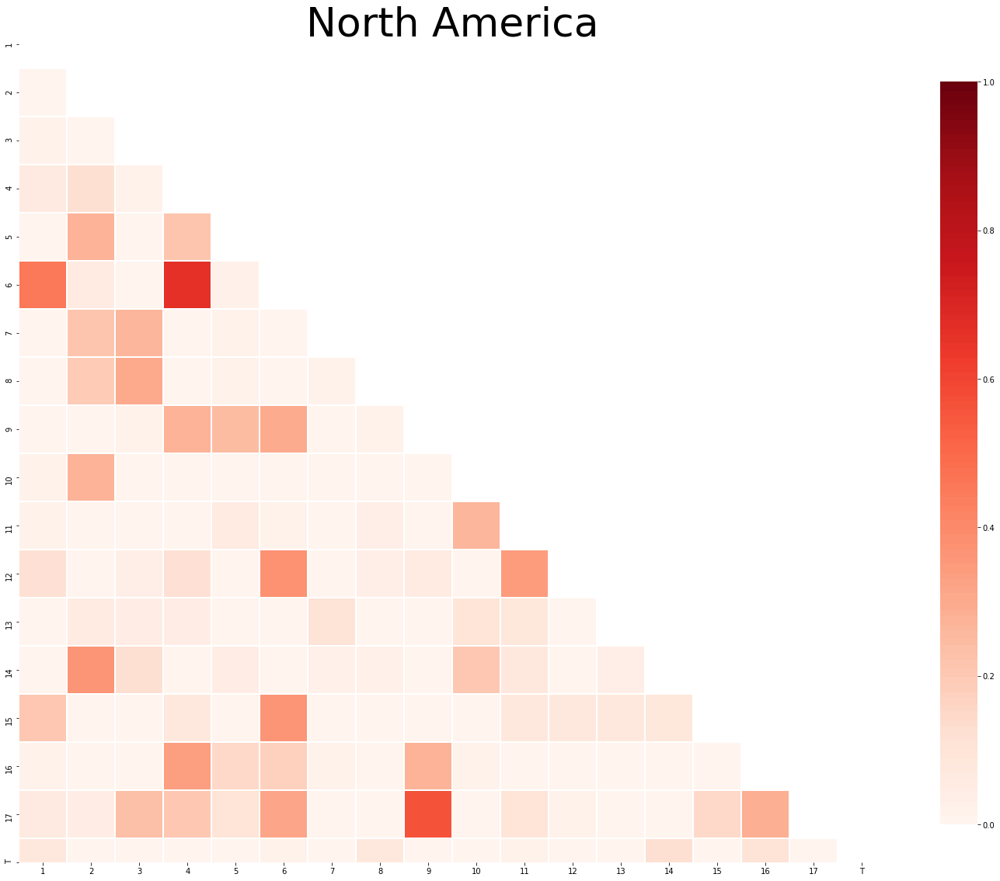

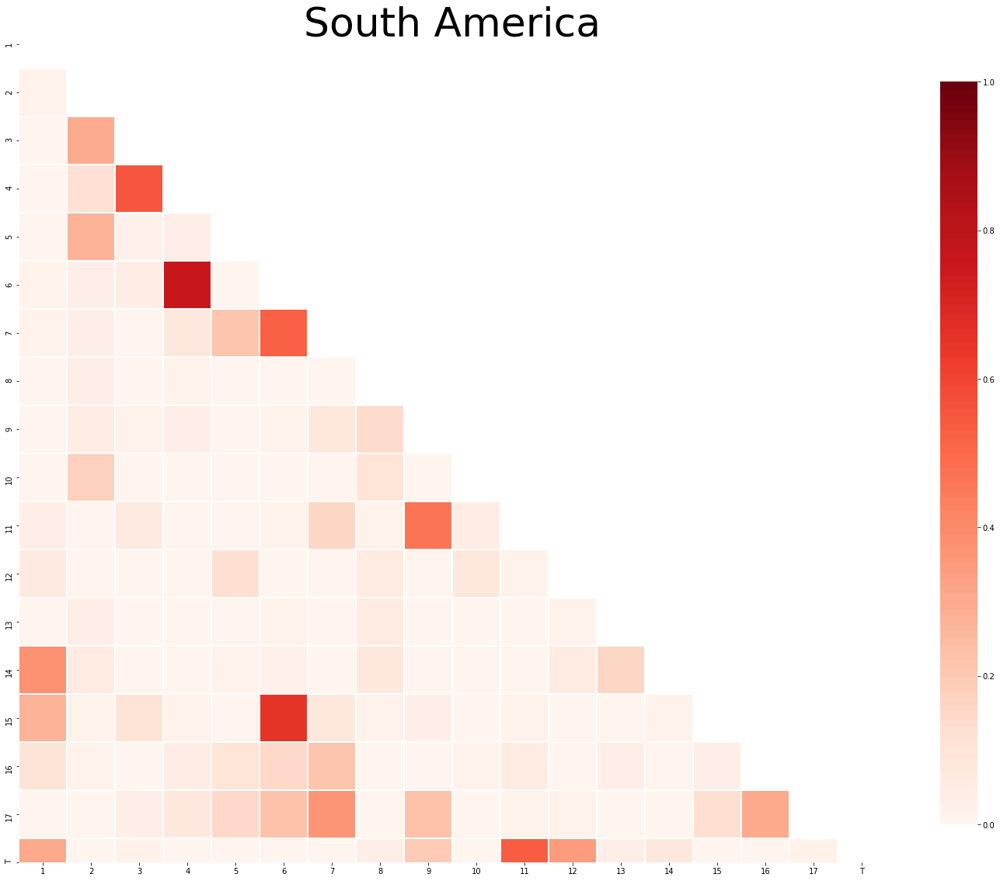

...

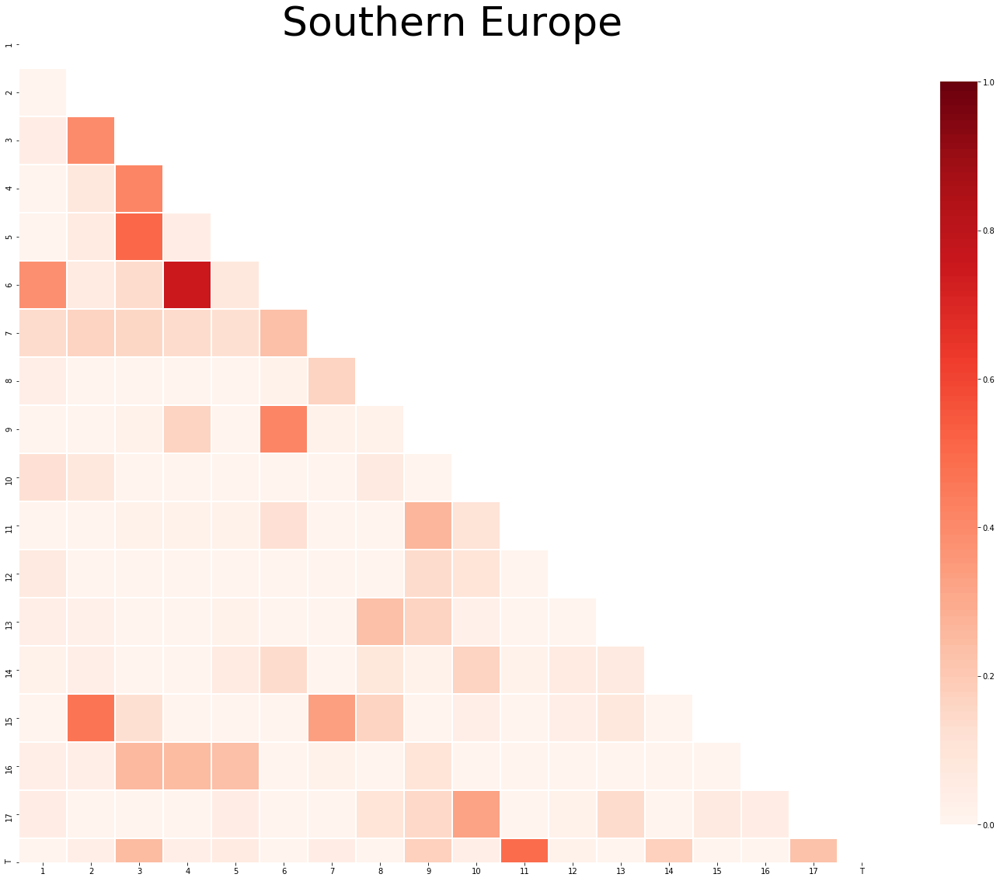

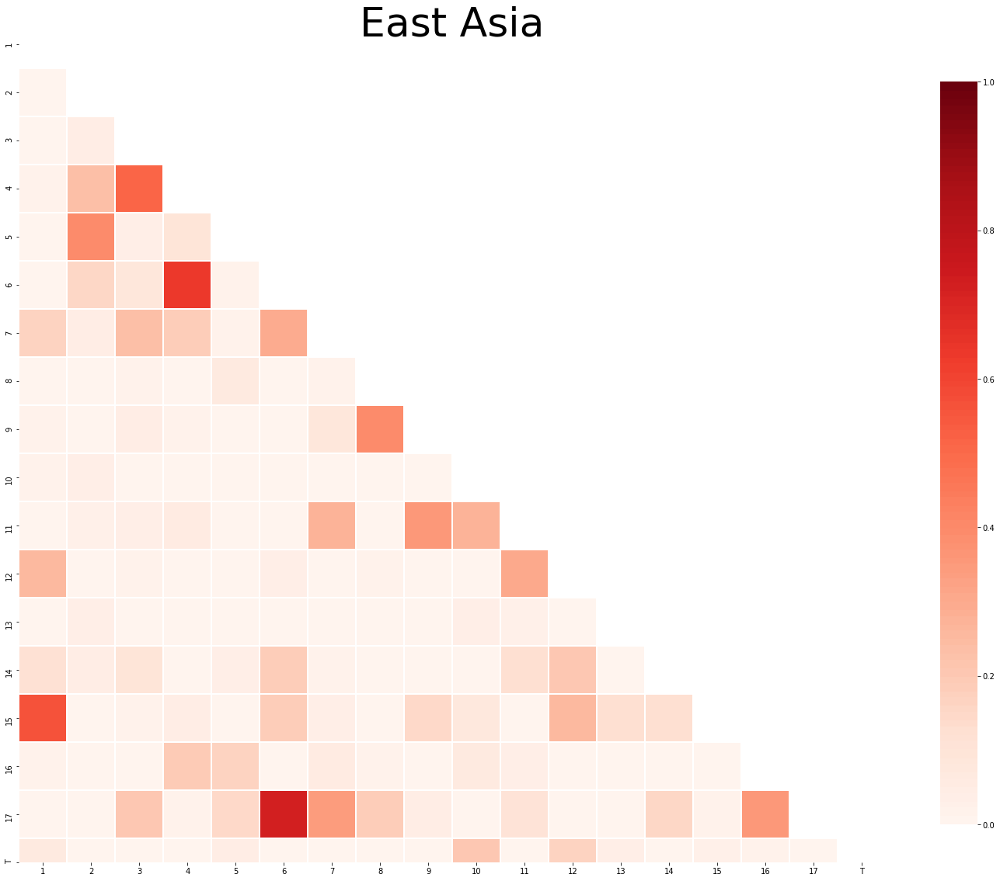

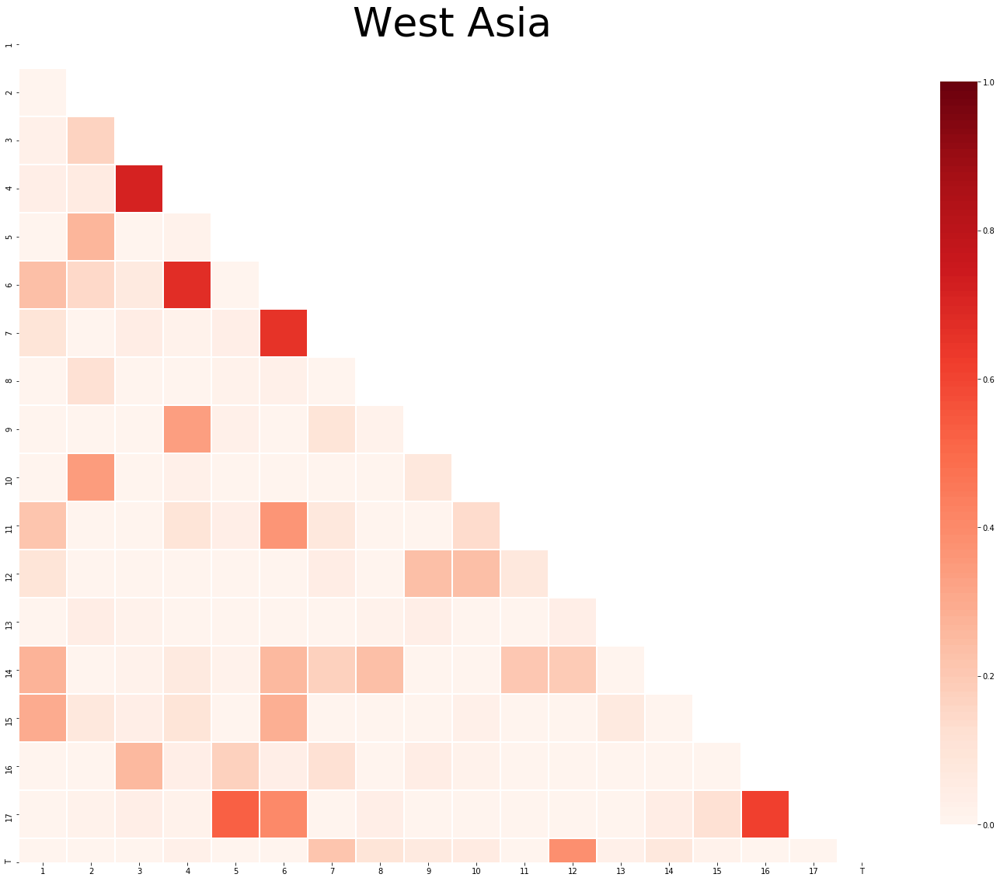

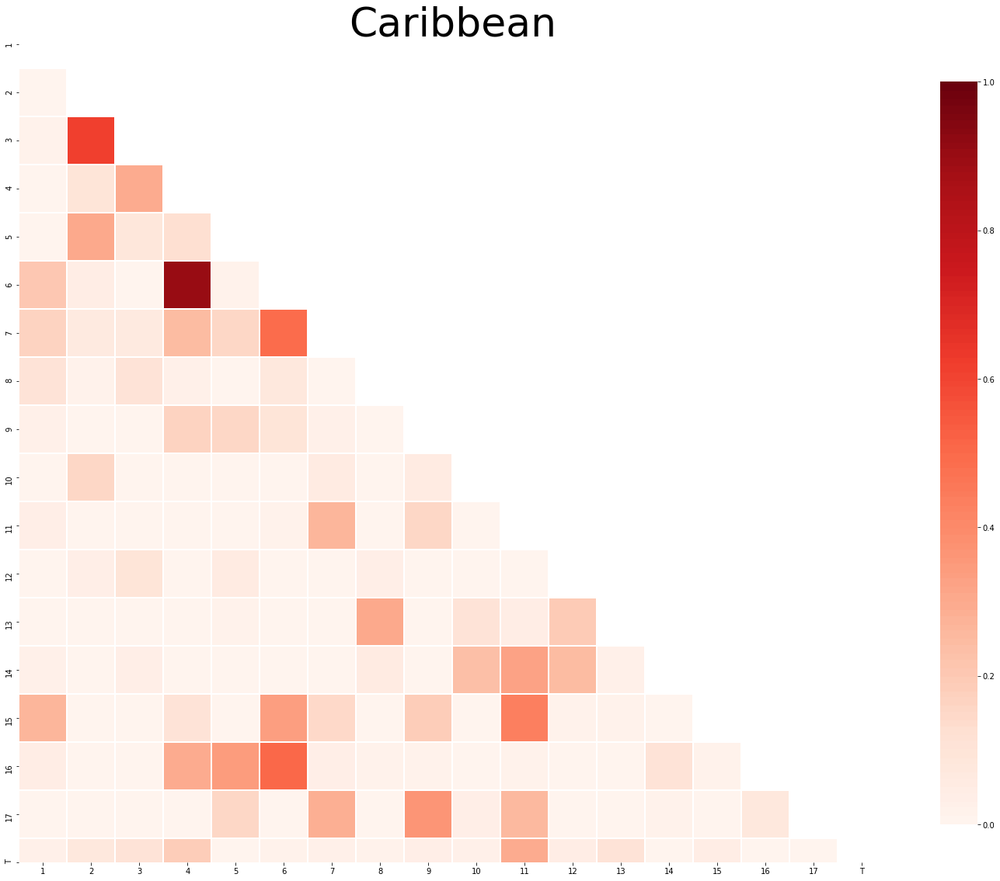

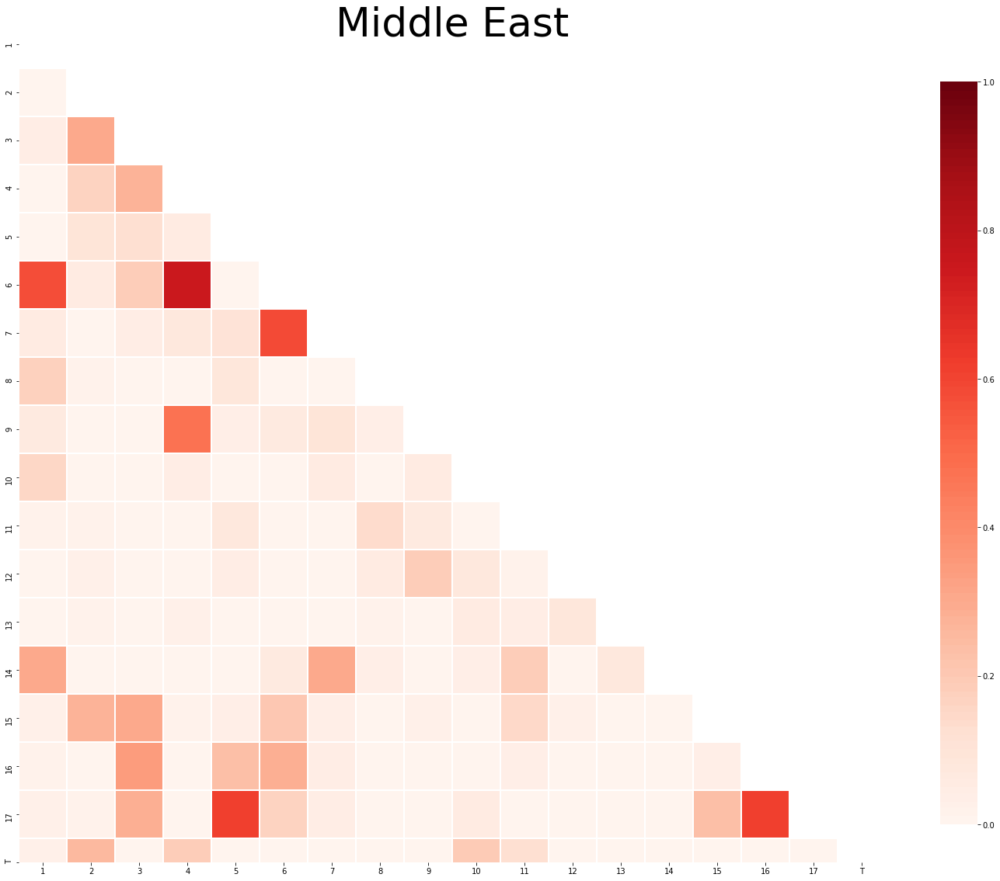

In [53]:
# continents
for continent in continents:
    # generate a mask for the upper triangle
    mask = np.zeros_like(cor_goals_continents_2[continent].fillna(0), dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # set up the matplotlib figure
    f, ax = plt.subplots(figsize=(25, 22))

    # generate a custom diverging colormap
    cmap = sns.color_palette("Reds", 100)

    # draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(cor_goals_continents_2[continent].fillna(0), mask=mask, cmap=cmap, vmax=1, center=0.5, vmin=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .8})
    
    plt.title('{}'.format(continent), fontdict={'fontsize': 52})
    plt.savefig('distance_cor/goals/{}_cor_goals.png'.format(continent))

In [54]:
# data preparation for networkX
dcor_dict_g = {}

for continent in cor_goals_continents_2.keys():
    dcor_dict_g[continent] = {}

    for goalcombination in g_combinations:
        dcor_dict_g[continent][goalcombination] = cor_goals_continents_2[continent].loc[goalcombination[1], goalcombination[0]]

In [55]:
for continent in cor_goals_continents_2.keys():
    for key in dcor_dict_g[continent].keys():
        if key[1] == 'T':
            dcor_dict_g[continent][tuple((key[0], '18'))] = dcor_dict_g[continent].pop(tuple((key[0], 'T')))
        elif key[0] == 'T':
            dcor_dict_g[continent][tuple(('18', key[1]))] = dcor_dict_g[continent].pop(tuple(('T', key[1])))

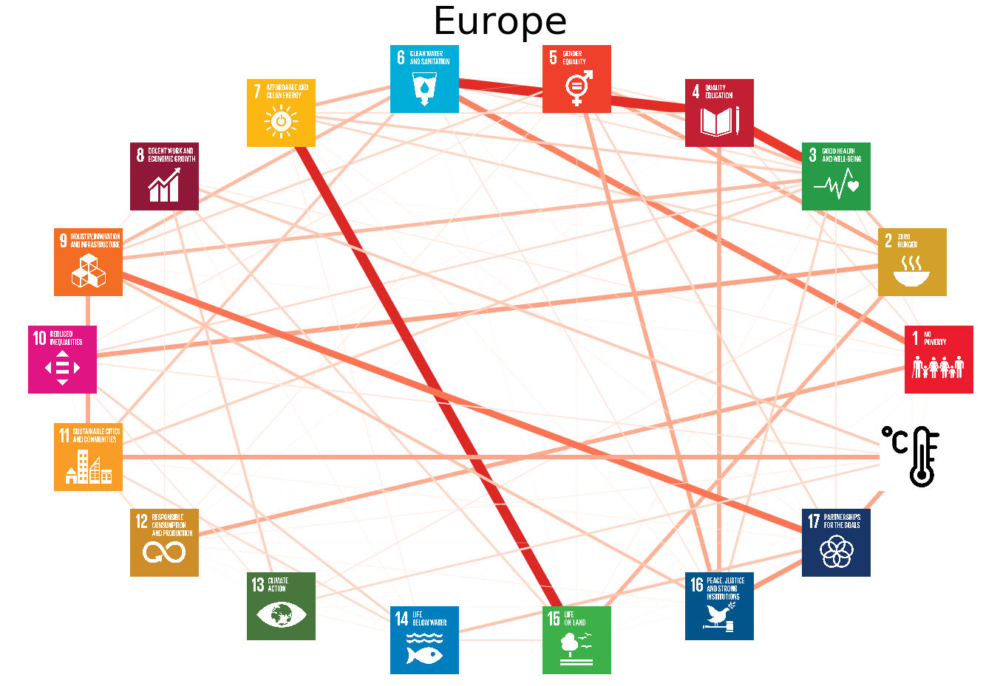

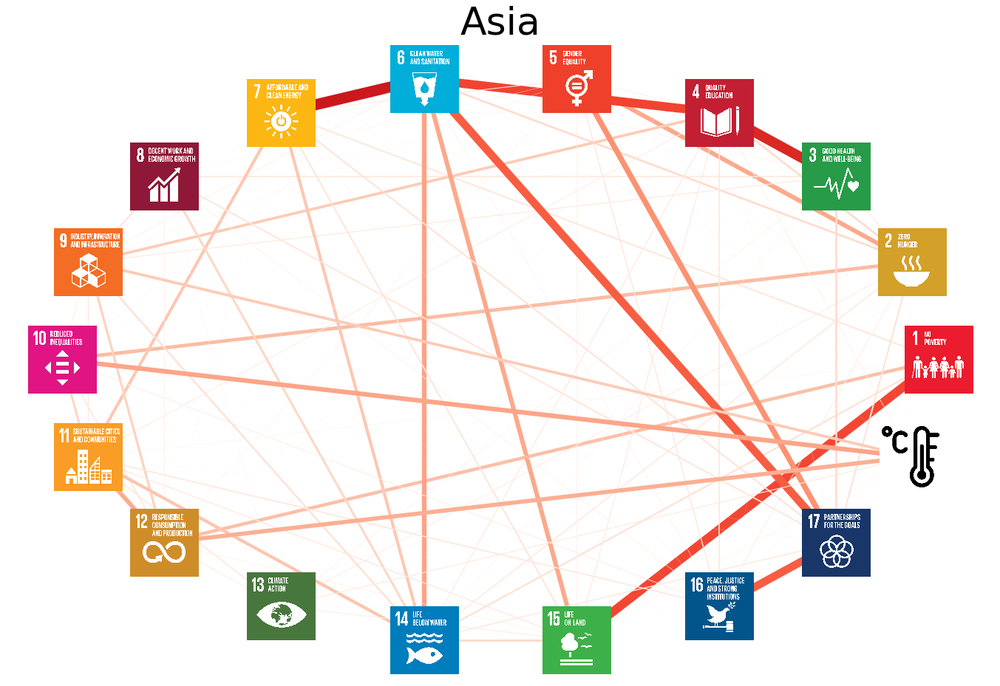

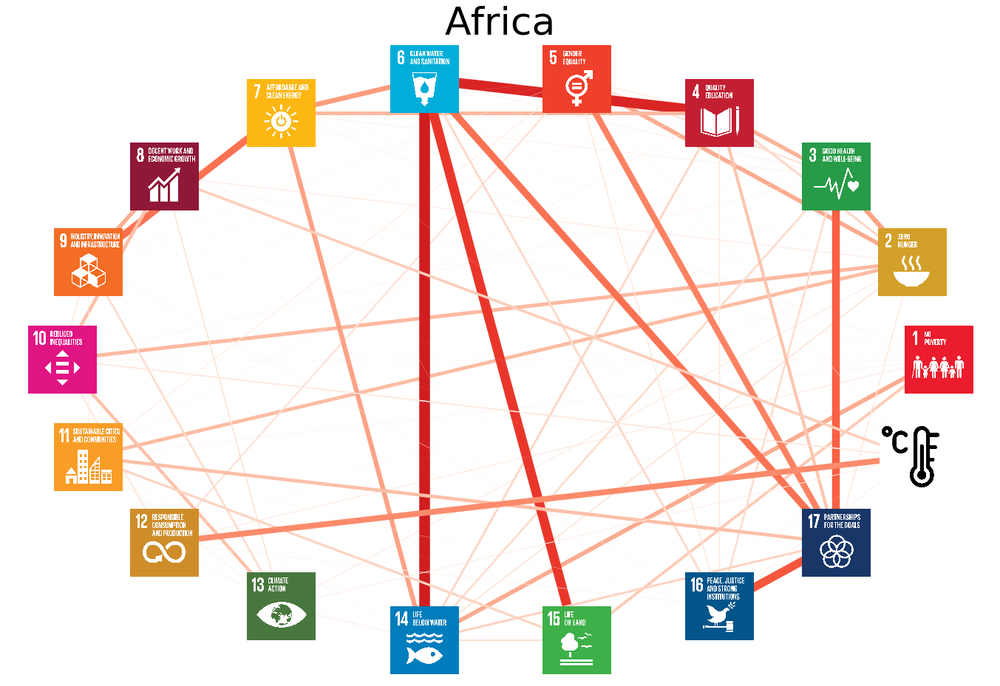

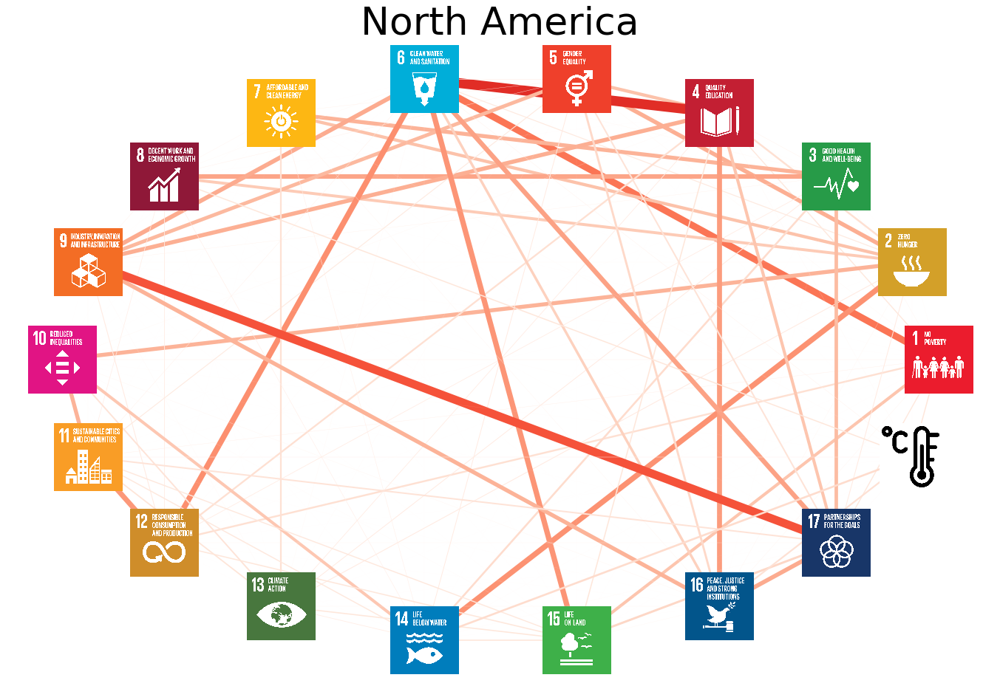

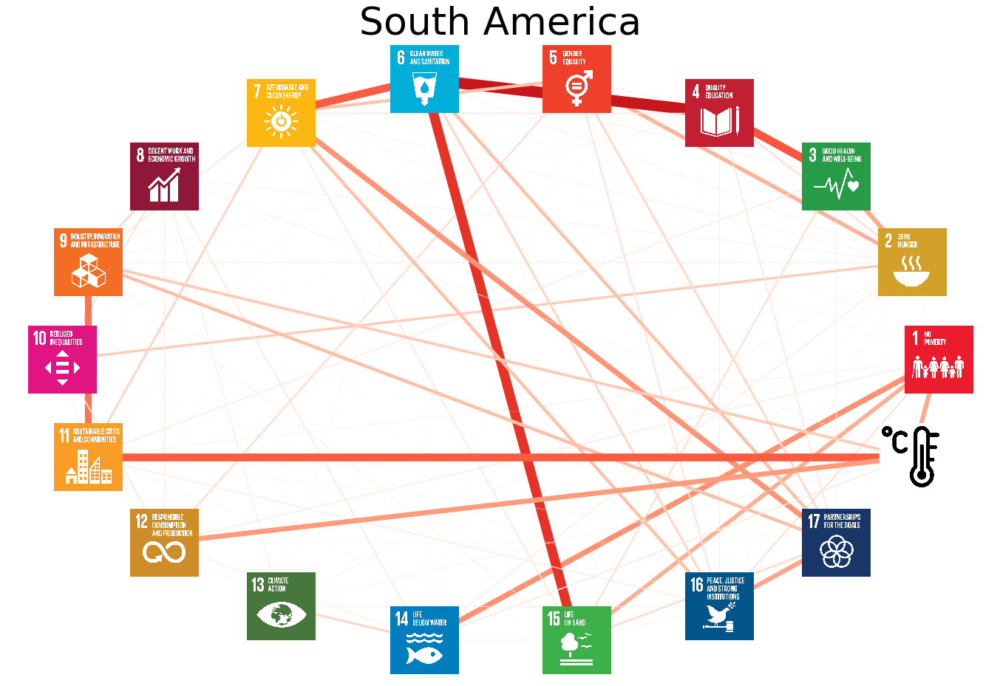

...

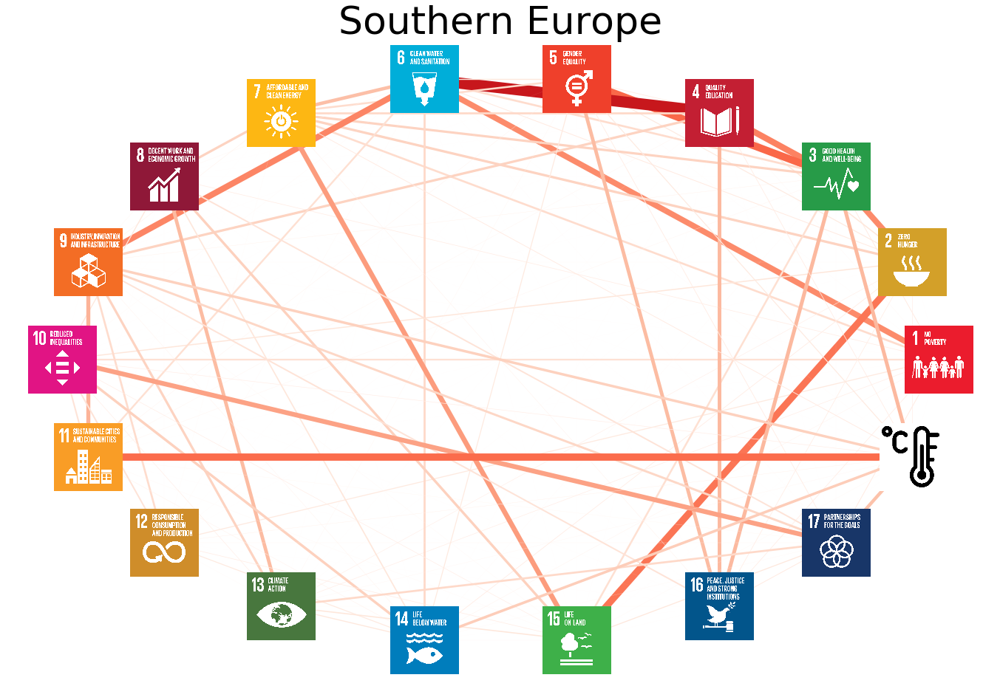

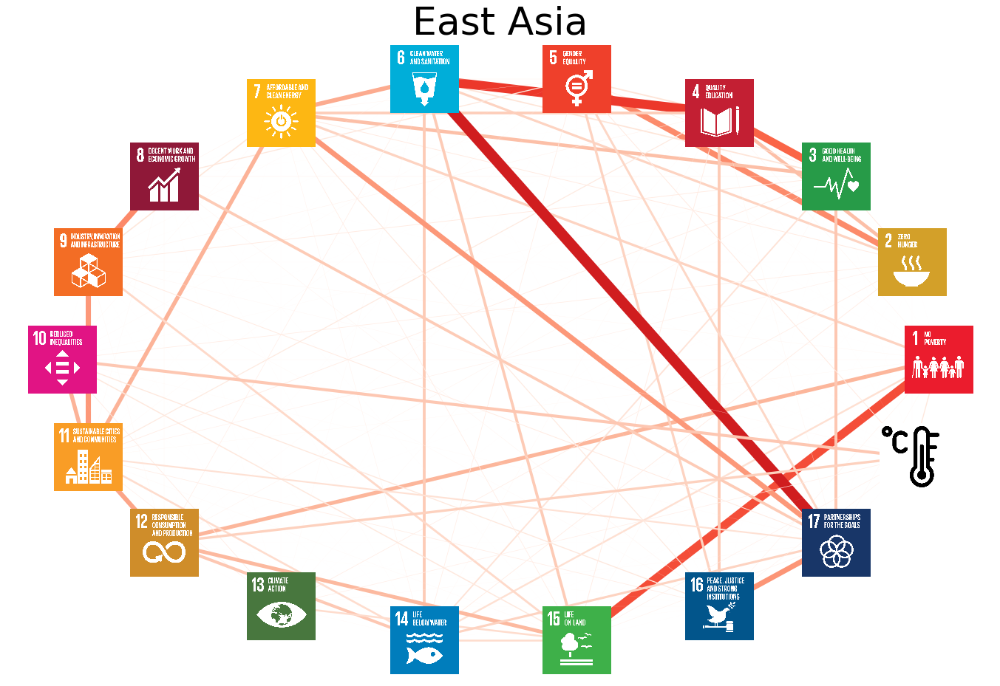

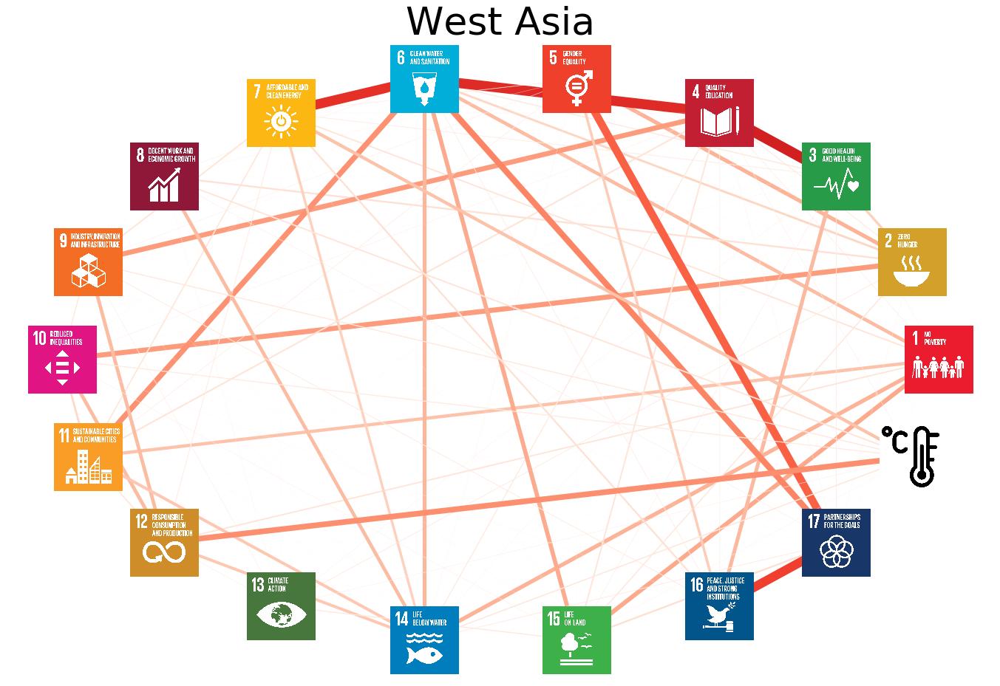

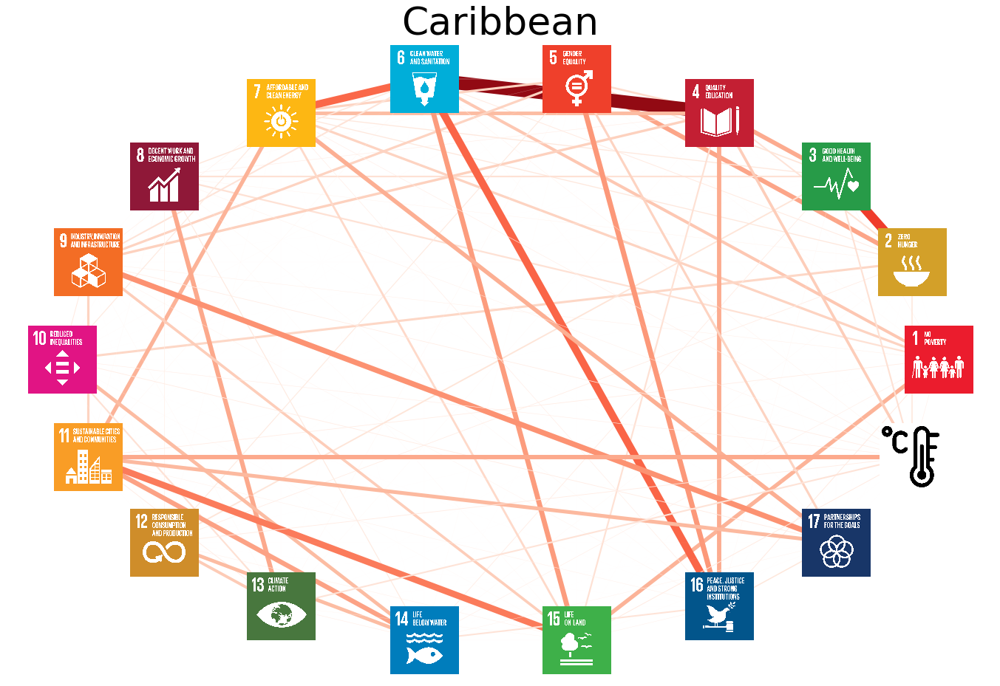

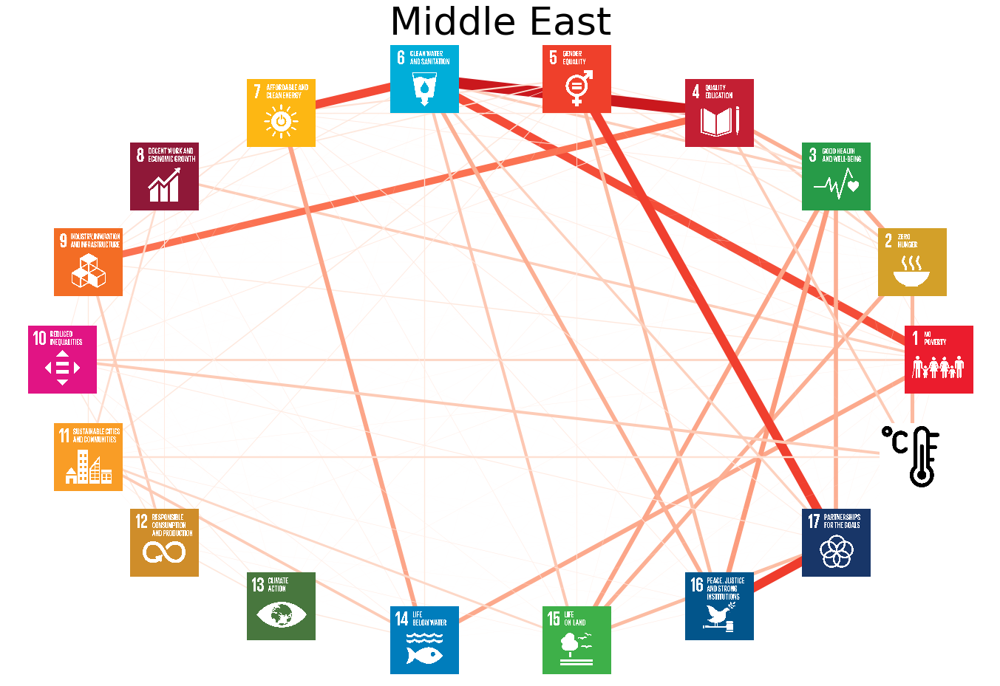

In [56]:
# plotting networks with weighted edges

centrality_C = {}     # dictionary to save centralities
density_C = {}    # dictionary to save weighted densities

for continent in cor_goals_continents_2.keys():
    G_C = nx.Graph()

    for key, value in dcor_dict_g[continent].items():
        G_C.add_edge(int(key[0]), int(key[1]), weight=value, color=sns.color_palette("Reds", 100)[int(np.around(value*100))], alpha=value)
        
    pos = nx.circular_layout(G_C)
    
    plt.figure(figsize=(24,16))

    # nodes
    nx.draw_networkx_nodes(G_C, pos, node_size=1000)

    # labels
    nx.draw_networkx_labels(G_C, pos, font_size=46, font_family='sans-serif')

    nodes = G_C.nodes()
    edges = G_C.edges()
    colors = [G_C[u][v]['color'] for u,v in edges]
    weights = [G_C[u][v]['weight'] for u,v in edges]

    nx.draw_networkx(G_C, pos, with_labels=False, edges=edges, edge_color=colors, node_color='white', node_size=1000, width=np.multiply(weights,20))

    ax=plt.gca()
    fig=plt.gcf()
    trans = ax.transData.transform
    trans_axes = fig.transFigure.inverted().transform
    imsize = 0.08    # this is the image size
    plt.title('{}'.format(continent), fontdict={'fontsize': 52})

    for node in G_C.nodes():
        (x,y) = pos[node]   
        xx,yy = trans((x,y)) # figure coordinates
        xa,ya = trans_axes((xx,yy)) # axes coordinates
        a = plt.axes([xa-imsize/2.0,ya-imsize/2.0, imsize, imsize])
        a.imshow(mpimg.imread('utils/images/E_SDG goals_icons-individual-rgb-{}.png'.format(node)))
        a.axis('off')


    plt.axis('off')
    ax.axis('off')
    
    plt.savefig('distance_cor/goals/{}_circular_network_logos.png'.format(continent), format='png')

    plt.show()
    
    # centrality
    centr = nx.eigenvector_centrality(G_C, weight='weight')
    centrality_C[continent] = sorted((v, '{:0.2f}'.format(c)) for v, c in centr.items())
    
    # weighted density
    density_C[continent] = 2 * np.sum(weights) / (len(nodes) * (len(nodes) - 1))

In [57]:
for continent in continents:
    print(continent)
    print(centrality_C[continent])
    print('-------------------------')

Europe
[(1, '0.18'), (2, '0.19'), (3, '0.40'), (4, '0.42'), (5, '0.23'), (6, '0.38'), (7, '0.24'), (8, '0.07'), (9, '0.29'), (10, '0.11'), (11, '0.20'), (12, '0.08'), (13, '0.05'), (14, '0.09'), (15, '0.18'), (16, '0.28'), (17, '0.24'), (18, '0.11')]
-------------------------
Asia
[(1, '0.15'), (2, '0.17'), (3, '0.22'), (4, '0.37'), (5, '0.15'), (6, '0.54'), (7, '0.36'), (8, '0.07'), (9, '0.11'), (10, '0.07'), (11, '0.15'), (12, '0.09'), (13, '0.03'), (14, '0.26'), (15, '0.23'), (16, '0.17'), (17, '0.35'), (18, '0.06')]
-------------------------
Africa
[(1, '0.10'), (2, '0.16'), (3, '0.26'), (4, '0.37'), (5, '0.16'), (6, '0.52'), (7, '0.24'), (8, '0.03'), (9, '0.09'), (10, '0.05'), (11, '0.11'), (12, '0.03'), (13, '0.03'), (14, '0.37'), (15, '0.23'), (16, '0.20'), (17, '0.39'), (18, '0.02')]
-------------------------
North America
[(1, '0.21'), (2, '0.14'), (3, '0.10'), (4, '0.43'), (5, '0.20'), (6, '0.49'), (7, '0.04'), (8, '0.06'), (9, '0.36'), (10, '0.06'), (11, '0.11'), (12, '0.20'

In [58]:
for continent in continents:
    print(continent)
    print(density_C[continent])
    print('-------------------------')

Europe
0.0811822112423832
-------------------------
Asia
0.0741473774487919
-------------------------
Africa
0.08117115565325148
-------------------------
North America
0.07630602223825173
-------------------------
South America
0.07273782853142756
-------------------------
Oceania
0.0738292742098428
-------------------------
Northern Africa
0.07477102154679832
-------------------------
Southern Africa
0.07872642833125557
-------------------------
Northern Europe
0.07784038712232548
-------------------------
Southern Europe
0.0775017638661646
-------------------------
East Asia
0.07717735853201073
-------------------------
West Asia
0.07963683655805237
-------------------------
Caribbean
0.08298688555150228
-------------------------
Middle East
0.0782418576664867
-------------------------


### Groups

In [59]:
# data preparation
groups_prep_g = {}
groups_prep_boot_g = {}

for group in groups:
    print(group)
    
    groups_prep_g[group] = pd.DataFrame(columns=period, index=goals)
    groups_prep_boot_g[group] = pd.DataFrame(columns=period, index=goals)
    
    for goal in goals:
        max_year_g = 0
        
        for year in period:
            y_g = []

            for country in groups[group].dropna():
                y_g.extend(goals_values_i[country].loc[str(goal), year])
            
            groups_prep_g[group].loc[goal, year] = y_g
    
            # finding year with most measurements
            len_year_g = len(y_g)
            if len_year_g > max_year_g:
                max_year_g = len_year_g
                
        # bootstrap to have same number of samples in each year
        for year in period:
            # not considering the years without samples
            if len(groups_prep_g[group].loc[goal, year]) == 0:
                continue    
            else:
                groups_prep_boot_g[group].loc[goal, year] = np.random.choice(groups_prep_g[group].loc[goal, year], size=max_year_g, replace=True).tolist()

Global North
Global South
Least Developed Countries (LDC)
Land Locked Developing Countries (LLDC)
Small Island Developing States (SIDS)
G20
Emerging Markets (BRICS + N-11)
OPEC
Low Income
Lower middle Income
Upper middle Income
High Income


In [60]:
# groups
# have conditions in joint random vector
dict_cov_goals_groups_2 = {}
dict_cor_goals_groups_2 = {}

for group in groups:
    print(group)
    
    dict_cov_goa_g = pairs_g.copy()
    dict_cor_goa_g = pairs_g.copy()
    
    for i, row in pairs_g.iterrows():
        #print(row)
        
        if row['condition'] == 0:            
            # pairwise distance correlation
            dict_cov_goa_g.loc[i, 'dcov'] = dcor.distance_covariance(np.array(groups_prep_boot_g[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_g[group].loc[row['pair_1']].to_list()))
            dict_cor_goa_g.loc[i, 'dcor'] = dcor.distance_correlation(np.array(groups_prep_boot_g[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_g[group].loc[row['pair_1']].to_list()))
        
        else:
            # partial distance correlation
            condition = pd.DataFrame(index=period, columns=row['condition'] + ['combined'])
            for y in period:
                condition.loc[y, 'combined'] = []
            for c in row['condition']:
                condition[c] = groups_prep_boot_g[group].loc[c]
                for y in period:
                    condition.loc[y, 'combined'].extend(condition.loc[y, c])
                    
            # square partial distance correlation to range [0, 1]    
            dict_cov_goa_g.loc[i, 'dcov'] = dcor.partial_distance_covariance(np.array(groups_prep_boot_g[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_g[group].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
            dict_cor_goa_g.loc[i, 'dcor'] = dcor.partial_distance_correlation(np.array(groups_prep_boot_g[group].loc[row['pair_0']].to_list()), np.array(groups_prep_boot_g[group].loc[row['pair_1']].to_list()), np.array(condition['combined'].to_list()))**2
        
        """
        if dict_cov_goa_g.loc[i, 'dcov'] < 0:
            dict_cov_goa_g.loc[i, 'dcov'] = 0
        if dict_cor_goa_g.loc[i, 'dcor'] < 0:
            dict_cor_goa_g.loc[i, 'dcor'] = 0 
        """
    
    # find minimum distance correlation between any two goals
    dict_cov_goa_gr = dict_cov_goa_g.groupby(['pair_0', 'pair_1'])['dcov'].apply(list).reset_index(name='list_dcov')
    dict_cor_goa_gr = dict_cor_goa_g.groupby(['pair_0', 'pair_1'])['dcor'].apply(list).reset_index(name='list_dcor')
    
    for i, row in dict_cov_goa_con.iterrows():
        dict_cov_goa_gr.loc[i, 'min_dcov'] = min(dict_cov_goa_gr.loc[i, 'list_dcov'])
        dict_cor_goa_gr.loc[i, 'min_dcor'] = min(dict_cor_goa_gr.loc[i, 'list_dcor'])
    
    dict_cov_goals_groups_2[group] = dict_cov_goa_gr
    dict_cor_goals_groups_2[group] = dict_cor_goa_gr

Global North
Global South
Least Developed Countries (LDC)
Land Locked Developing Countries (LLDC)
Small Island Developing States (SIDS)
G20
Emerging Markets (BRICS + N-11)
OPEC
Low Income
Lower middle Income
Upper middle Income
High Income


In [61]:
# CHECKPOINT
dict_cov_goals_groups_2 = pickle.load(open('distance_cor/goals/dict_cov_goals_groups_2.pkl', 'rb'))
dict_cor_goals_groups_2 = pickle.load(open('distance_cor/goals/dict_cor_goals_groups_2.pkl', 'rb'))

In [62]:
# save
g_cov = open('distance_cor/goals/dict_cov_goals_groups_2.pkl', 'wb')
pickle.dump(dict_cov_goals_groups_2, g_cov)
g_cov.close()

g_cor = open('distance_cor/goals/dict_cor_goals_groups_2.pkl', 'wb')
pickle.dump(dict_cor_goals_groups_2, g_cor)
g_cor.close()

In [63]:
for group in groups:
    for i, row in dict_cov_goals_groups_2[group].iterrows():
        dict_cov_goals_groups_2[group].loc[i, 'max_dcov'] = max(dict_cov_goals_groups_2[group].loc[i, 'list_dcov'])
        dict_cor_goals_groups_2[group].loc[i, 'max_dcor'] = max(dict_cor_goals_groups_2[group].loc[i, 'list_dcor'])
        dict_cov_goals_groups_2[group].loc[i, 'avg_dcov'] = np.mean(dict_cov_goals_groups_2[group].loc[i, 'list_dcov'])
        dict_cor_goals_groups_2[group].loc[i, 'avg_dcor'] = np.mean(dict_cor_goals_groups_2[group].loc[i, 'list_dcor'])

In [64]:
cov_goals_groups_2 = {}
cor_goals_groups_2 = {}

for group in groups:
    cov_goals_groups_2[group] = pd.DataFrame(index=goals, columns=goals)
    cor_goals_groups_2[group] = pd.DataFrame(index=goals, columns=goals)

    for i in list(dict_cov_goals_groups_2[group].index):
        goal_0 = dict_cov_goals_groups_2[group].loc[i, 'pair_0']
        goal_1 = dict_cov_goals_groups_2[group].loc[i, 'pair_1']
        
        # sqrt because squared distance correlations were previously computed
        cov_goals_groups_2[group].loc[goal_1, goal_0] = np.sqrt(dict_cov_goals_groups_2[group].loc[i, 'min_dcov'])
        cor_goals_groups_2[group].loc[goal_1, goal_0] = np.sqrt(dict_cor_goals_groups_2[group].loc[i, 'min_dcor'])

In [65]:
# check
cor_goals_groups_2['OPEC']

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,T
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.000647992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0653119,0.446821,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.101951,0.00549071,0.530043,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.0121307,0.0697169,0.0703017,0.0233249,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0.374743,0.133319,0.229137,0.851947,0.0440278,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.0104267,0.00217107,0.00395951,0.00981593,0.00446258,0.206688,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0.0213834,0.00145404,0.00221867,0.00749971,5.94576e-05,0.000483665,0.000595878,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.00126167,0.00649469,0.142889,0.136301,0.00898949,0.00786897,0.212097,0.0794811,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,0.0219159,0.000881951,0.000168157,0.00109577,0.0110508,0.00442335,0.000129832,0.0136284,0.00218695,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
# save
"""
if not os.path.exists('distance_cor/goals'):
    os.mkdir('distance_cor/goals')

for group in groups:
    cov_goals_groups_2[group].to_csv(r'distance_cor/goals/{}_dcov_goals.csv'.format(group))
    cor_goals_groups_2[group].to_csv(r'distance_cor/goals/{}_dcor_goals.csv'.format(group))
"""    
g_cov = open('distance_cor/goals/dcov_goals_groups_2.pkl', 'wb')
pickle.dump(cov_goals_groups_2, g_cov)
g_cov.close()

g_cor = open('distance_cor/goals/dcor_goals_groups_2.pkl', 'wb')
pickle.dump(cor_goals_groups_2, g_cor)
g_cor.close()

## Visualisation on goal-level
Additionally to the matrices with numbers, we would also like to visualise these matrices and plot these correlations as networks.

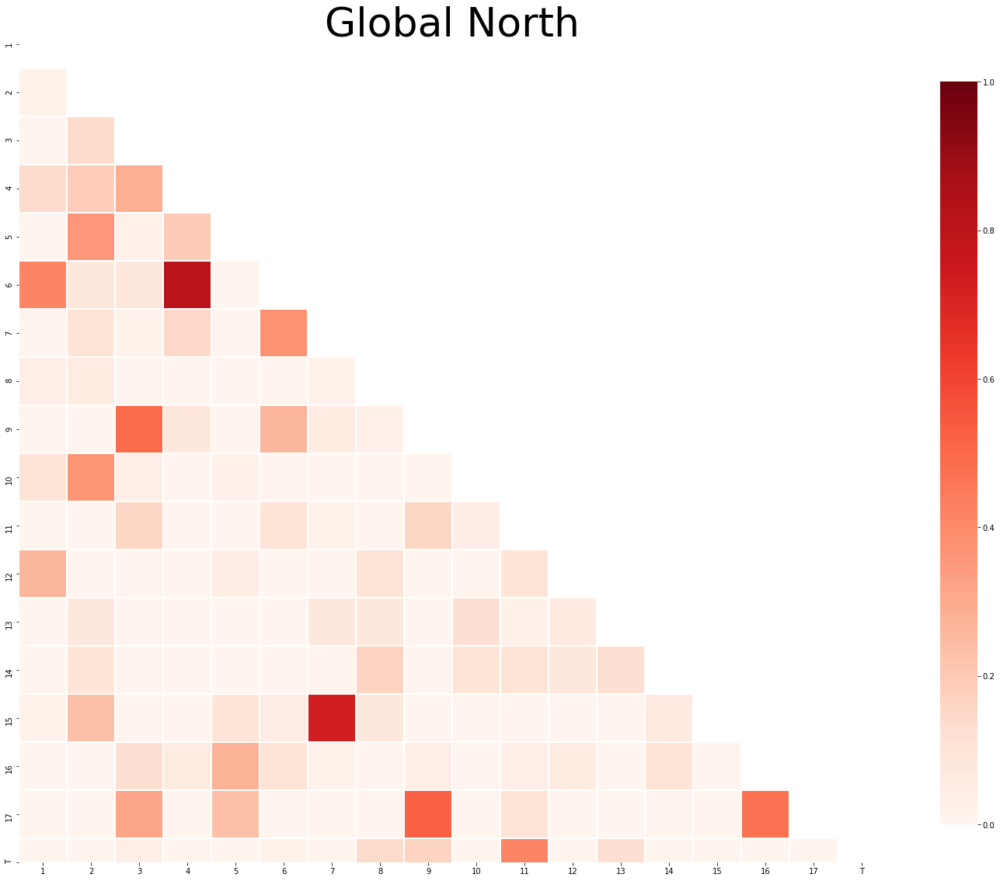

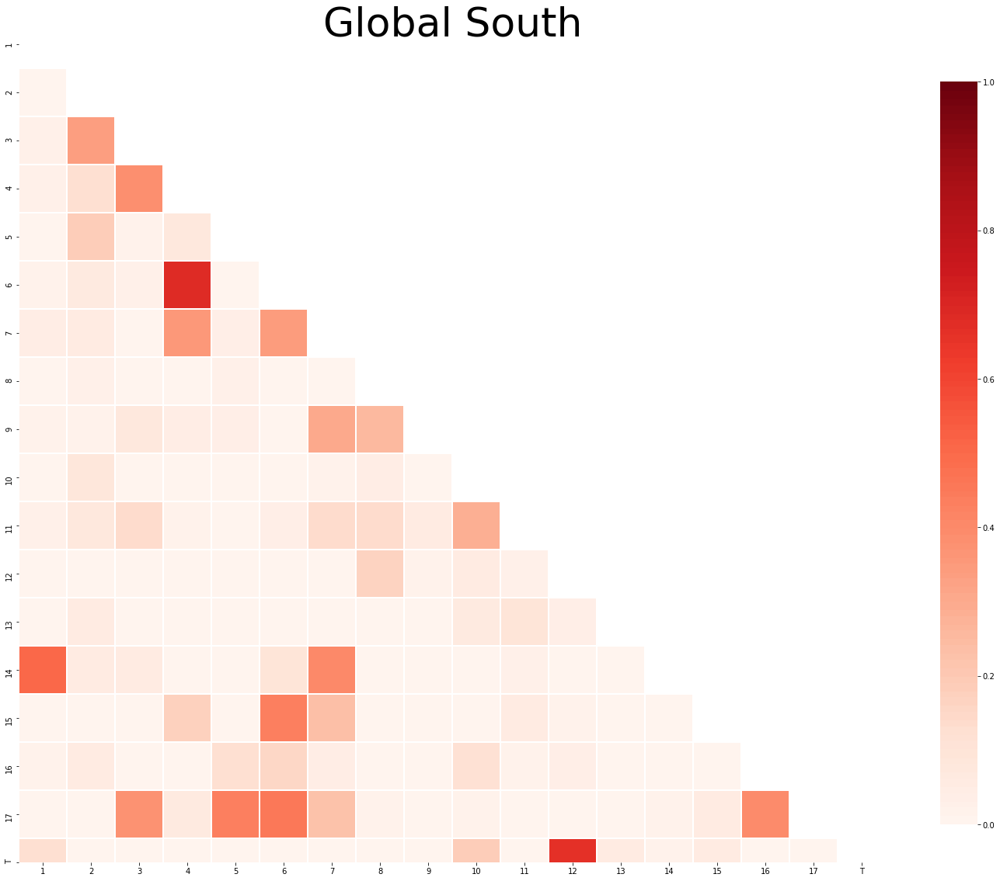

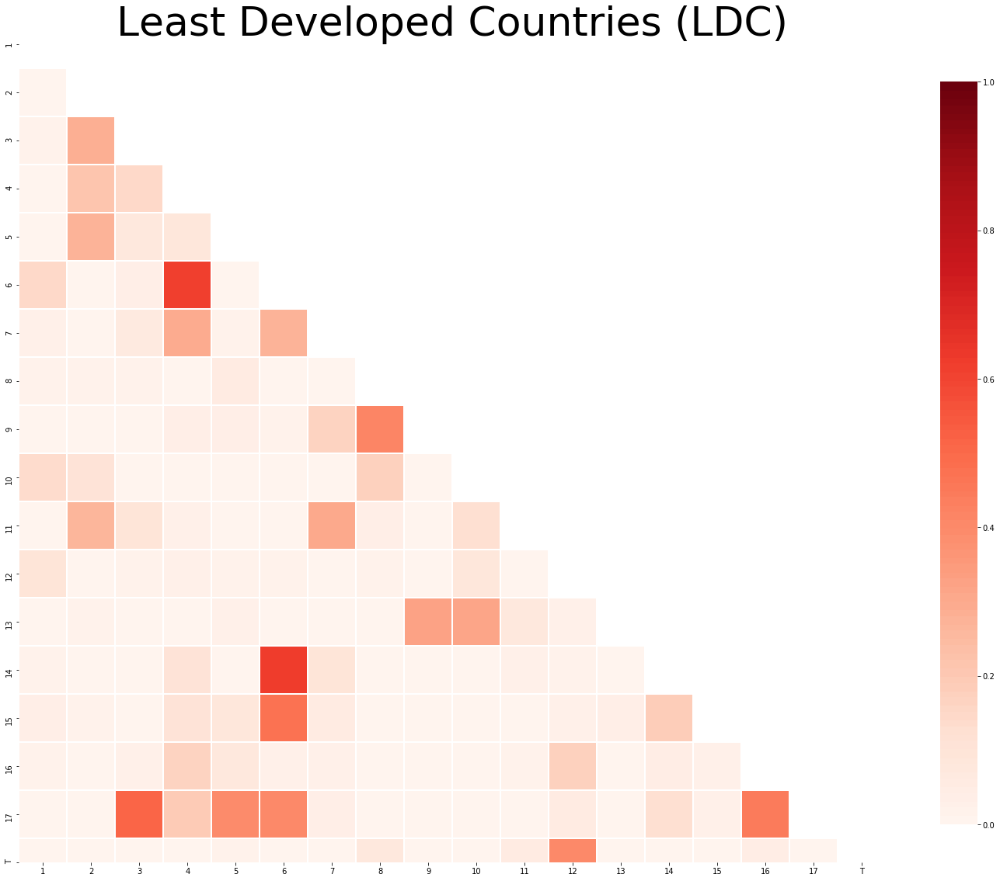

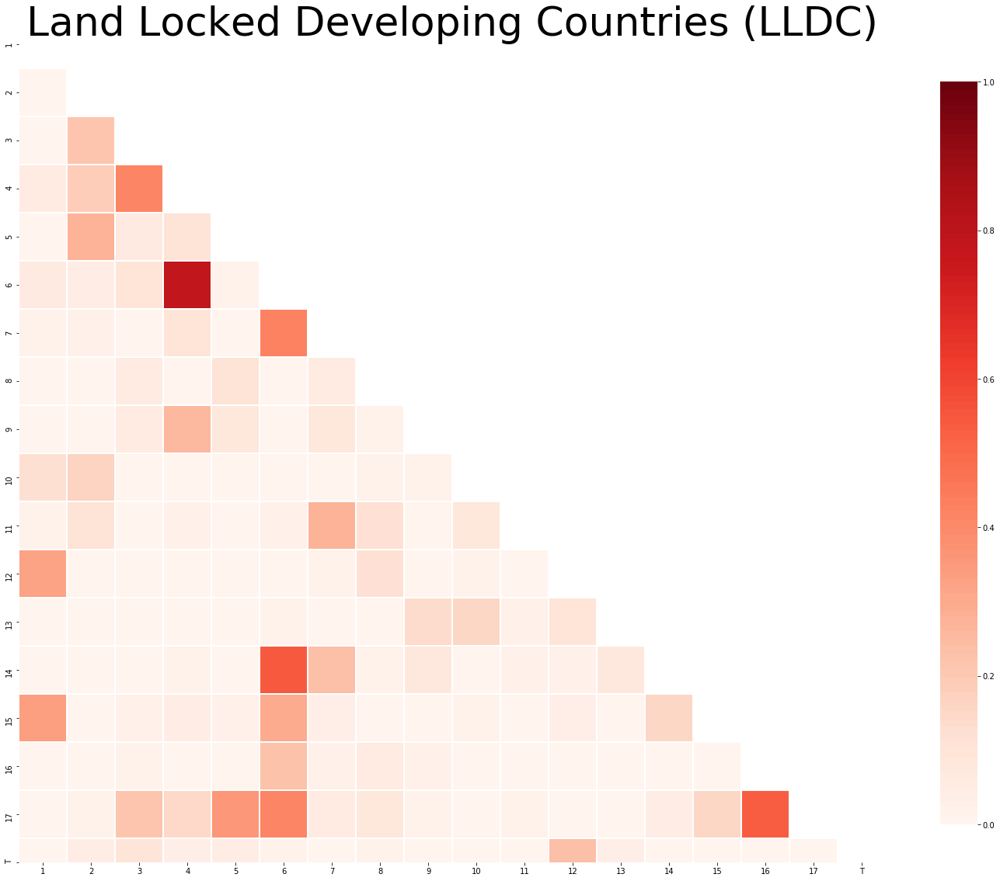

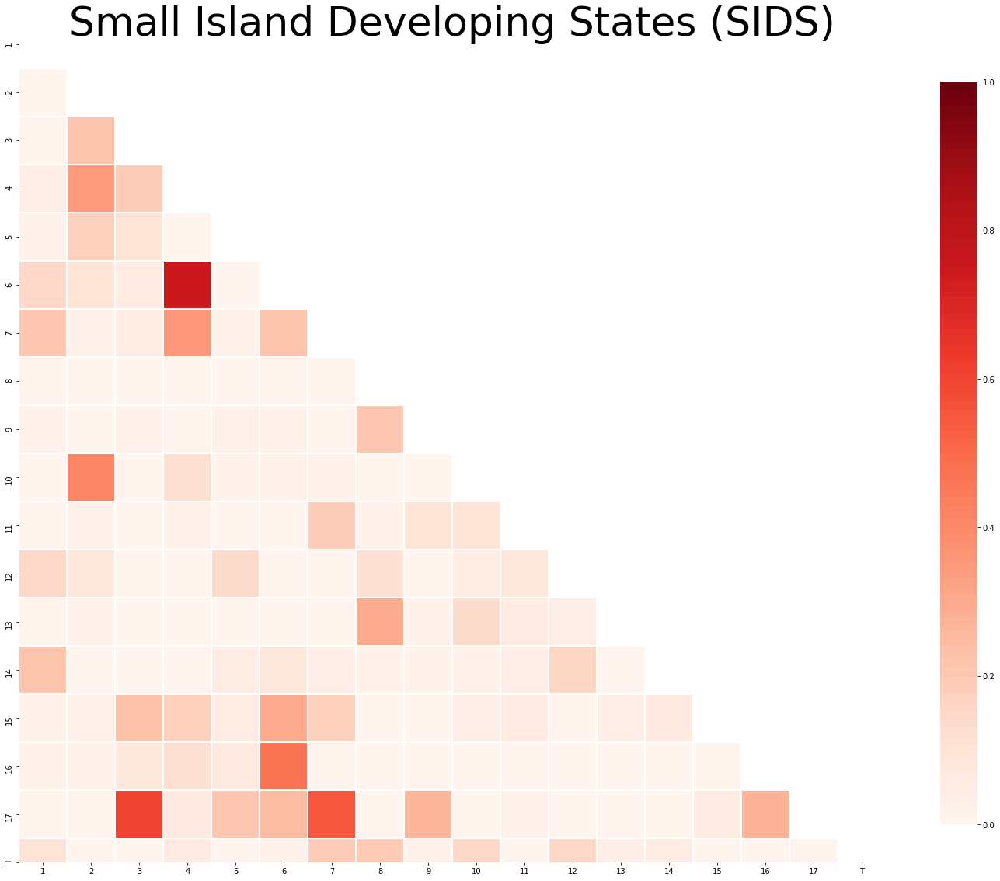

...

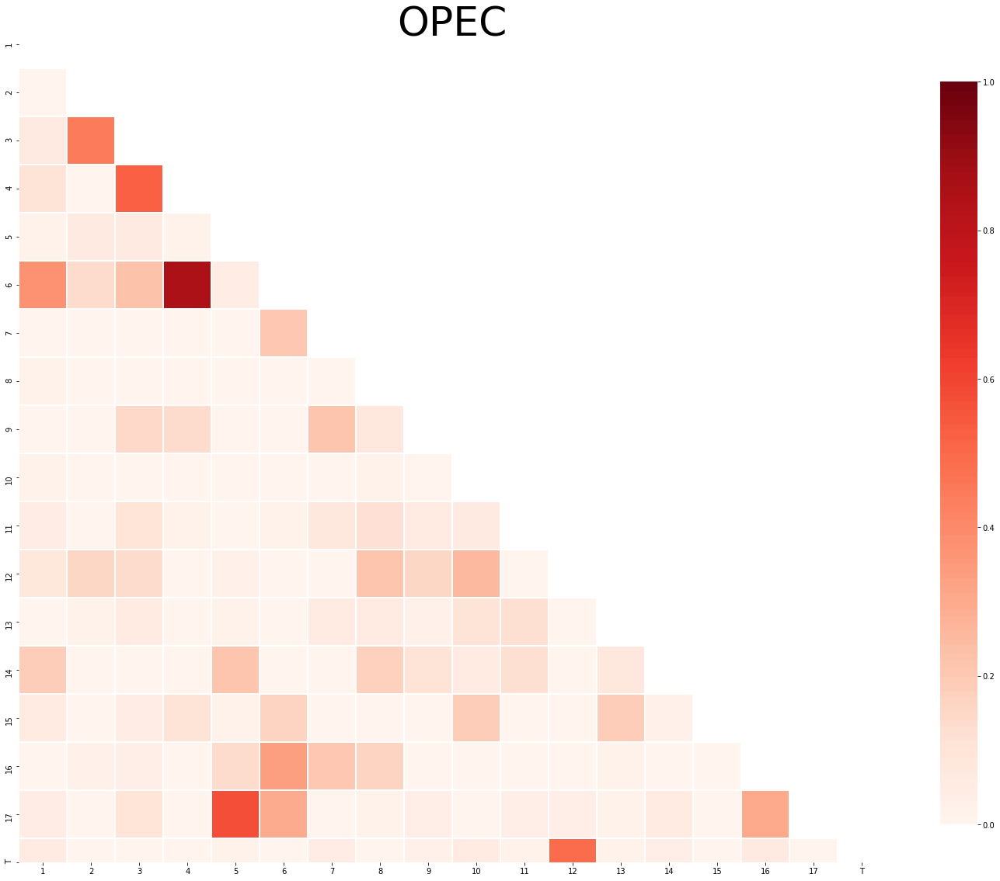

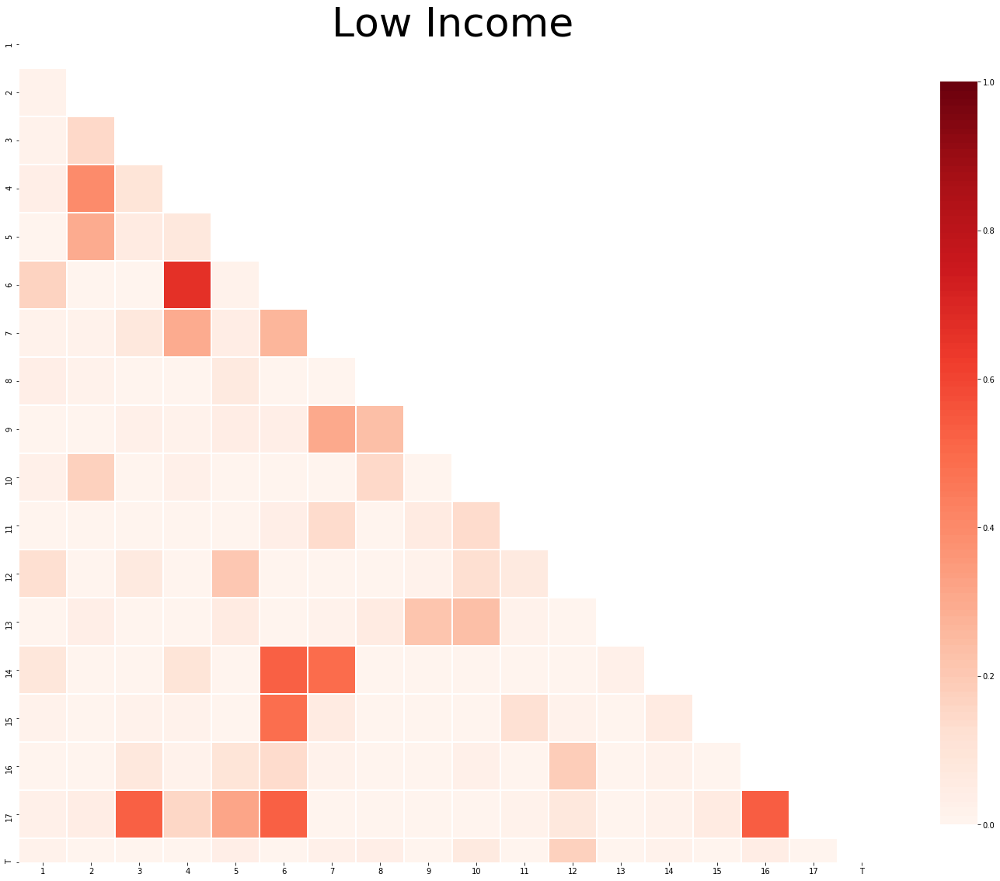

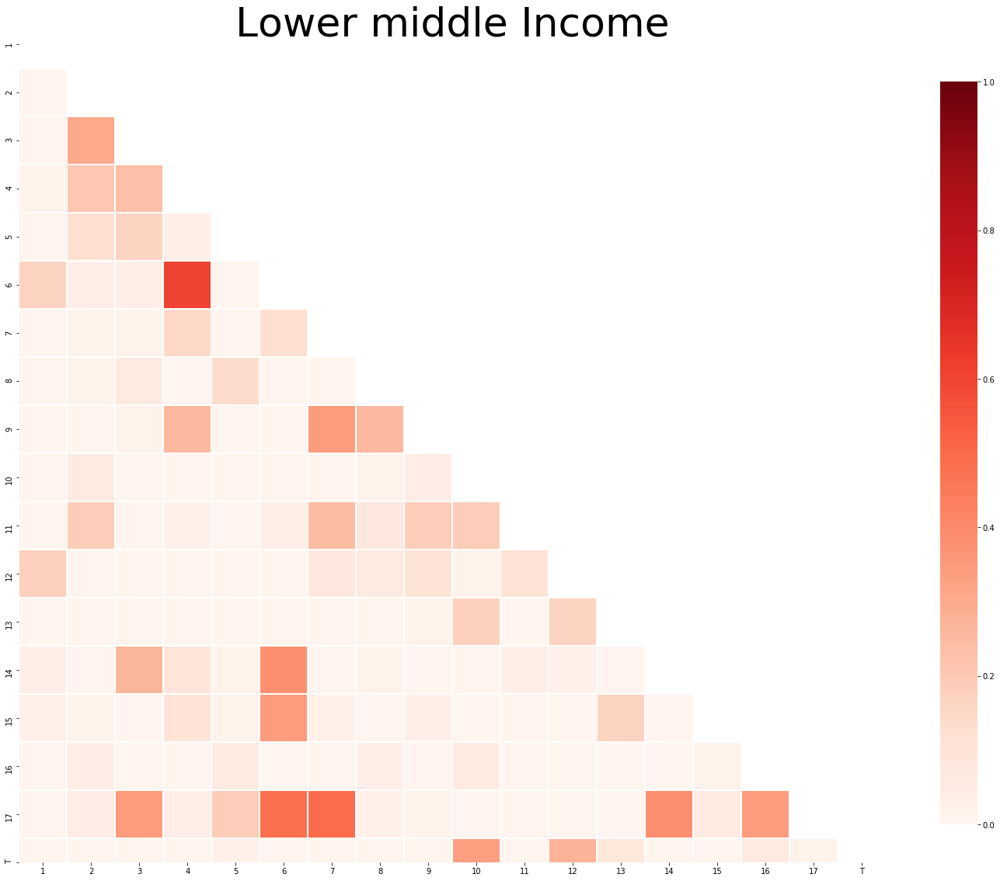

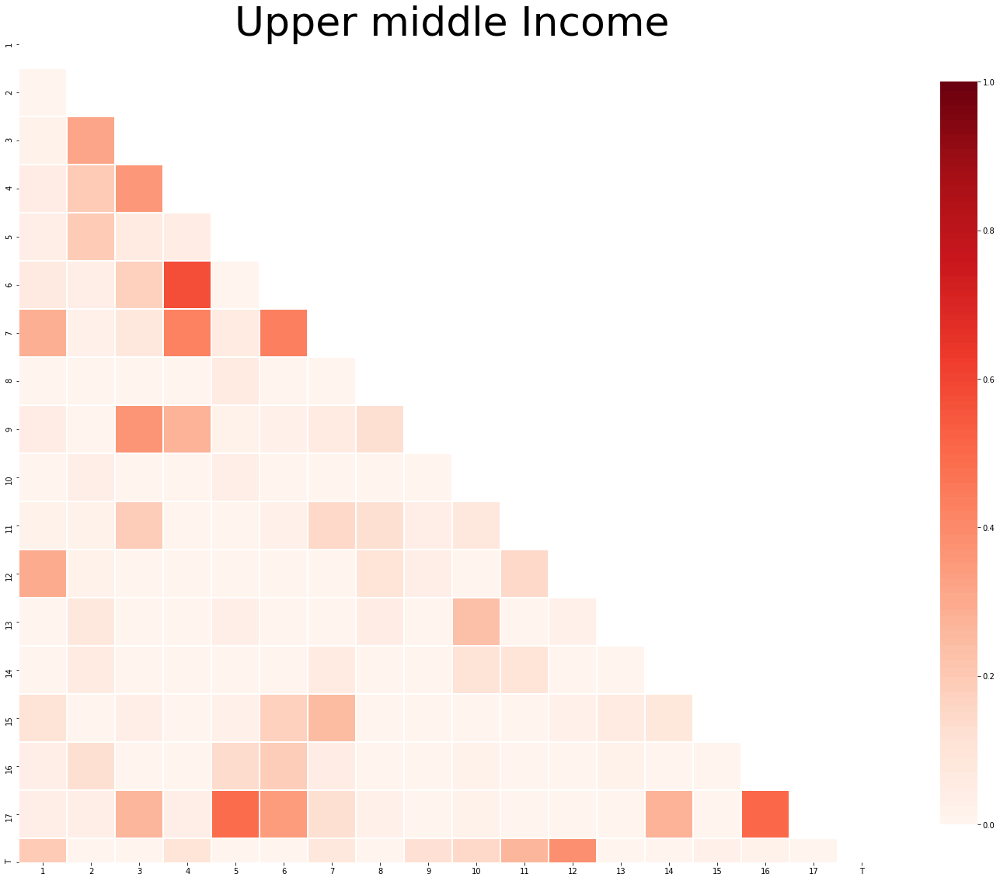

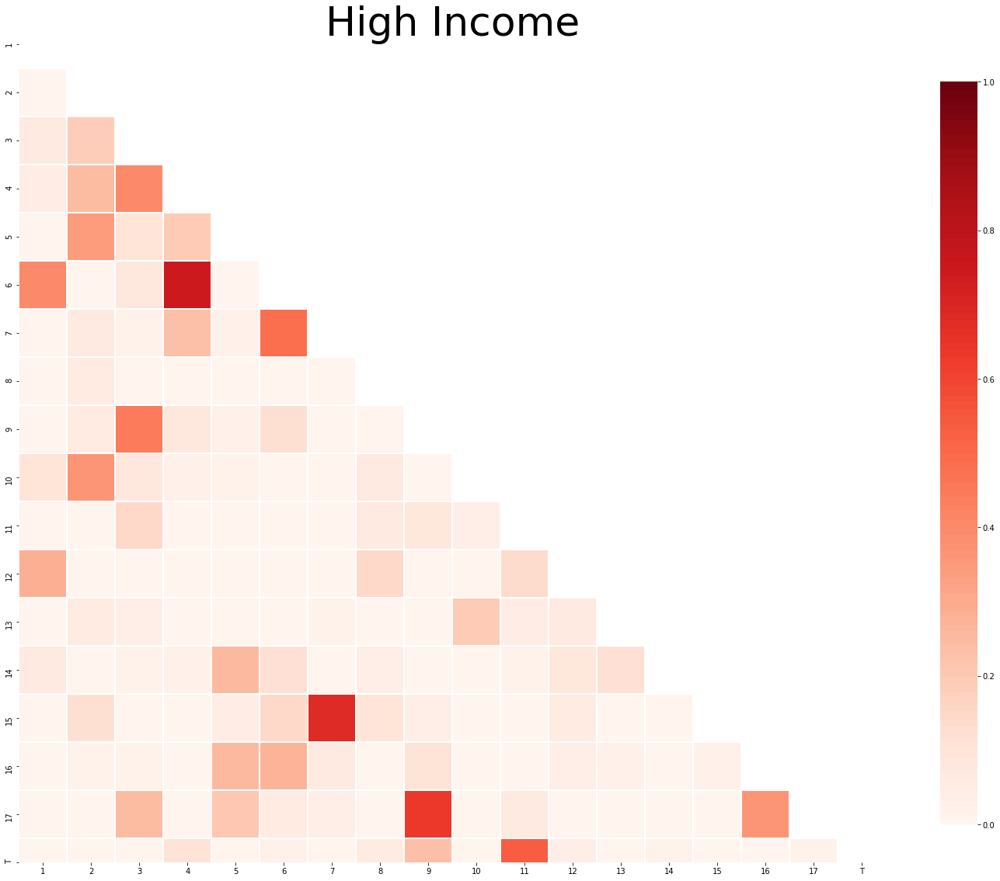

In [67]:
# groups
for group in groups:
    # generate a mask for the upper triangle
    mask = np.zeros_like(cor_goals_groups_2[group].fillna(0), dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # set up the matplotlib figure
    f, ax = plt.subplots(figsize=(25, 22))

    # generate a custom diverging colormap
    cmap = sns.color_palette("Reds", 100)

    # draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(cor_goals_groups_2[group].fillna(0), mask=mask, cmap=cmap, vmax=1, center=0.5, vmin=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .8})
    
    plt.title('{}'.format(group), fontdict={'fontsize': 52})
    plt.savefig('distance_cor/goals/{}_cor_goals.png'.format(group))

In [68]:
# data preparation for networkX
dcor_dict_g = {}

for group in cor_goals_groups_2.keys():
    dcor_dict_g[group] = {}

    for goalcombination in g_combinations:
        dcor_dict_g[group][goalcombination] = cor_goals_groups_2[group].loc[goalcombination[1], goalcombination[0]]

In [69]:
for group in cor_goals_groups_2.keys():
    for key in dcor_dict_g[group].keys():
        if key[1] == 'T':
            dcor_dict_g[group][tuple((key[0], '18'))] = dcor_dict_g[group].pop(tuple((key[0], 'T')))
        elif key[0] == 'T':
            dcor_dict_g[group][tuple(('18', key[1]))] = dcor_dict_g[group].pop(tuple(('T', key[1])))

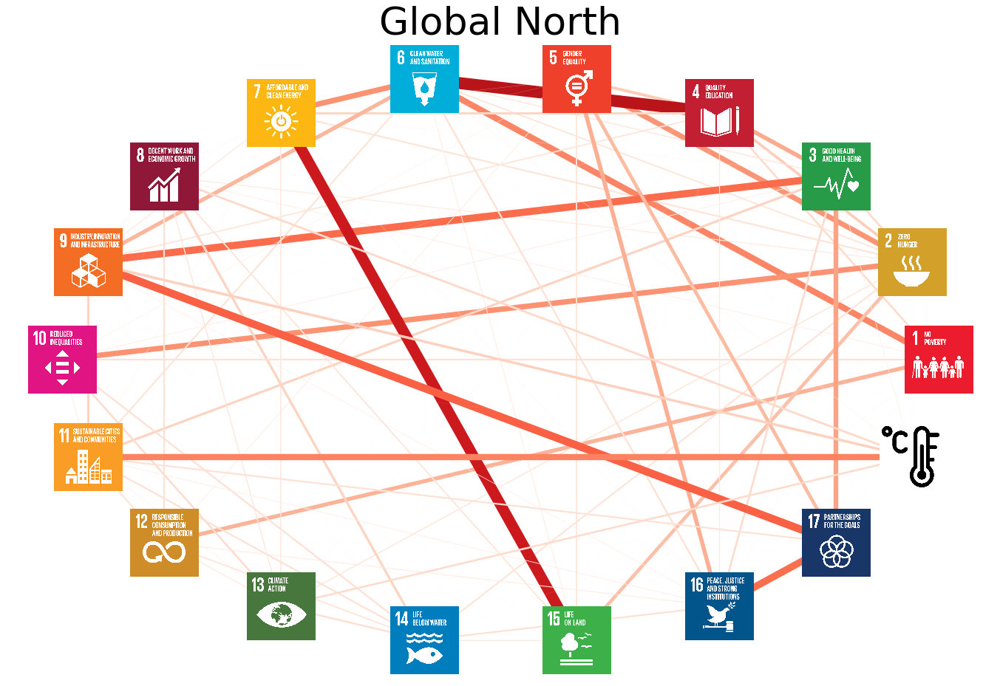

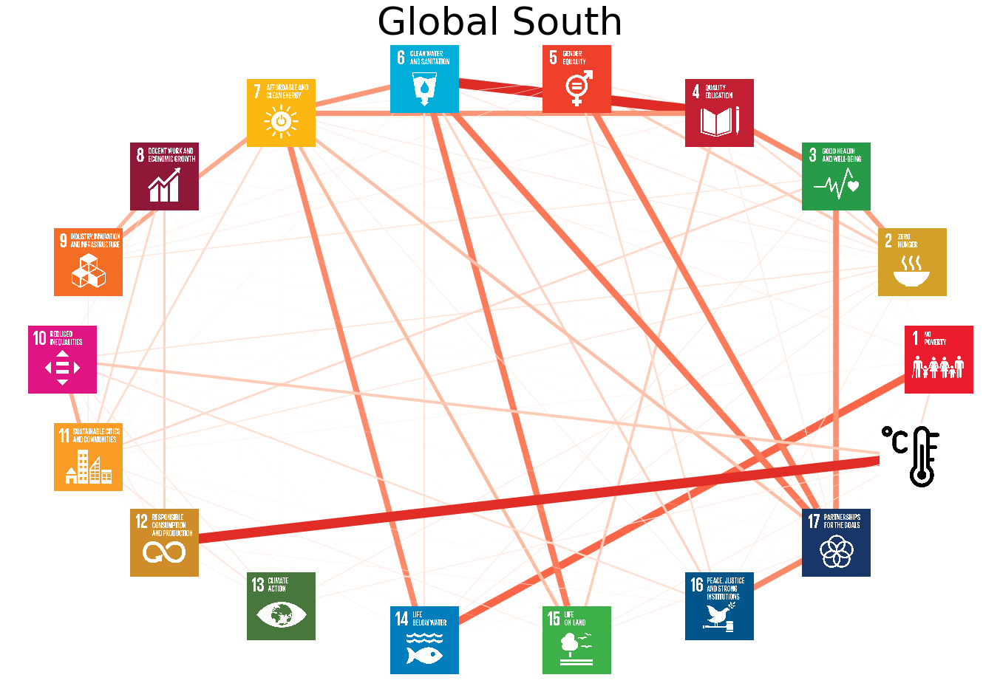

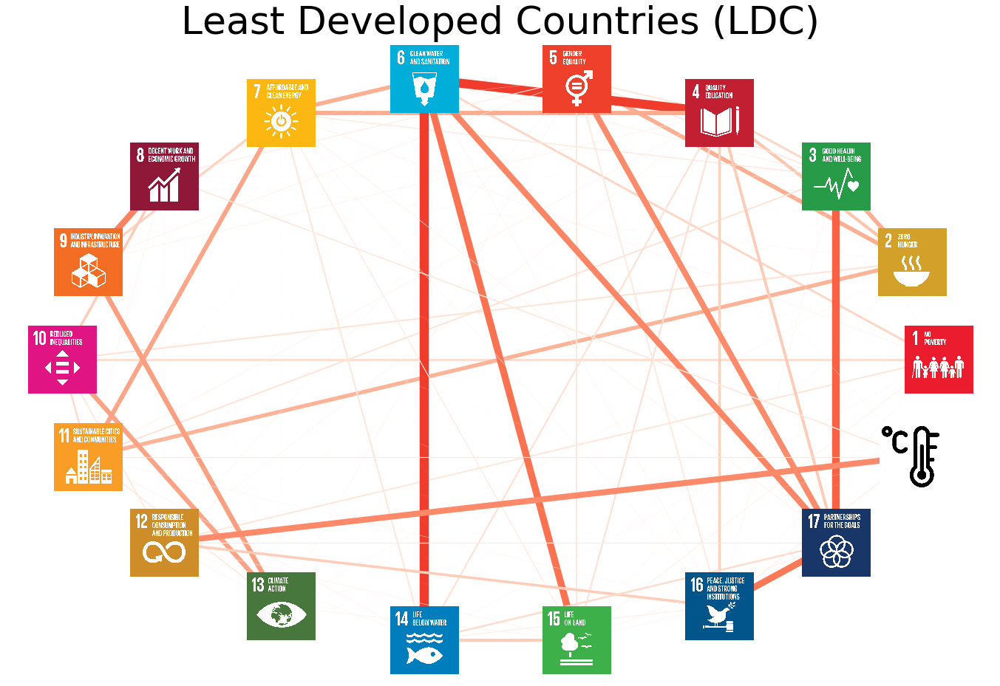

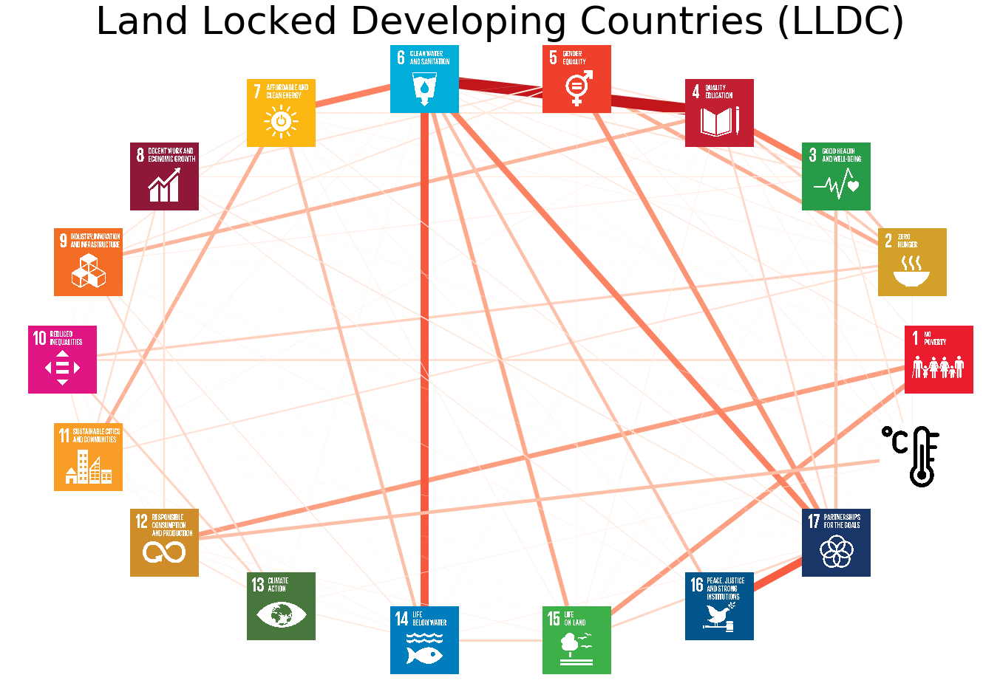

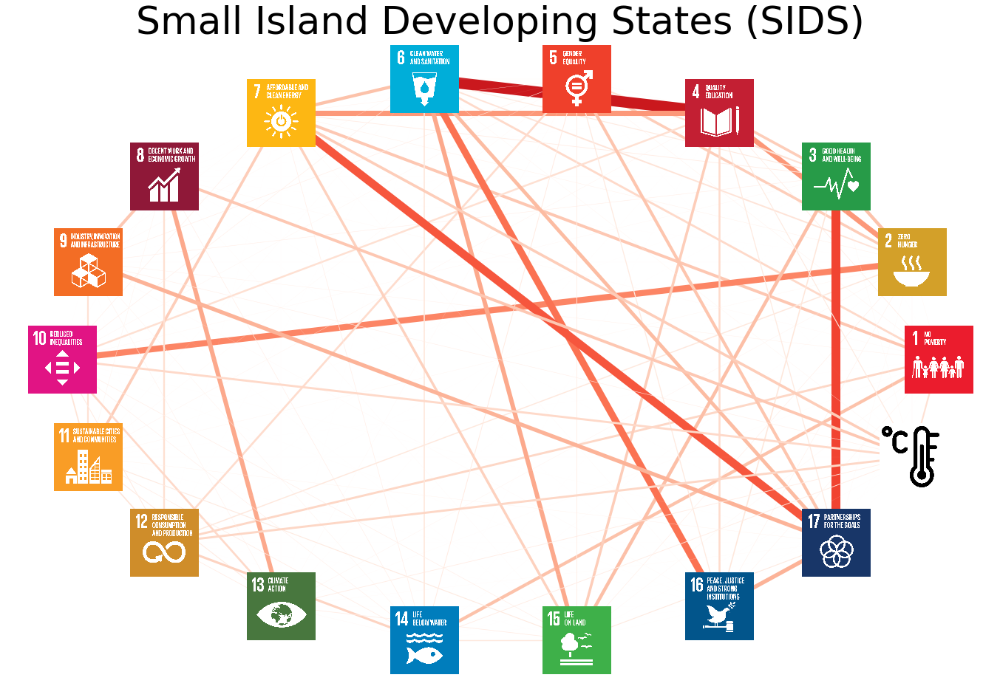

...

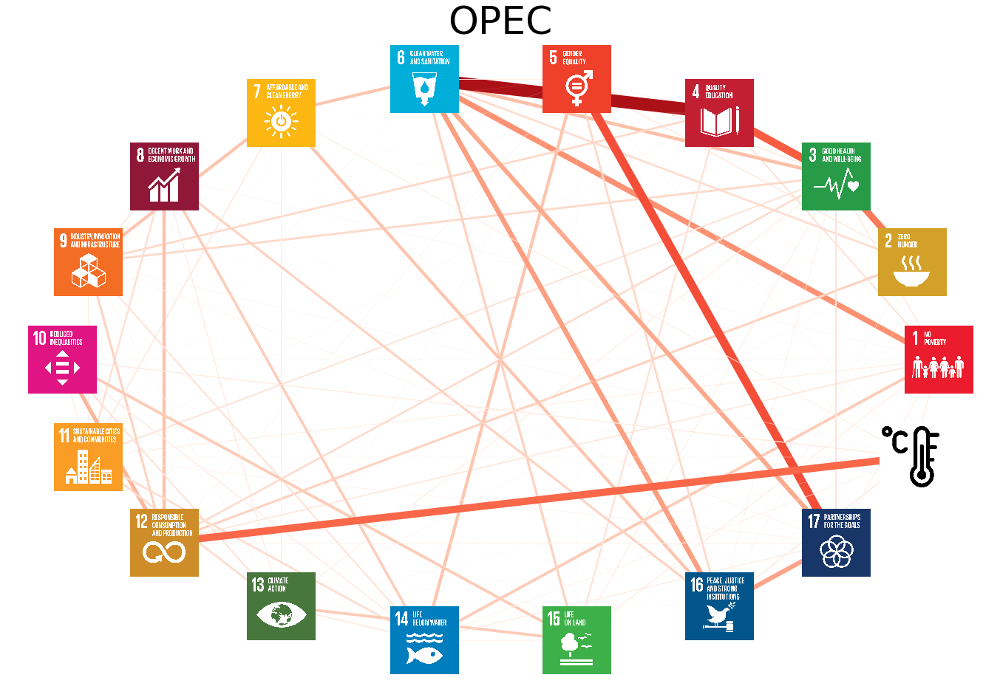

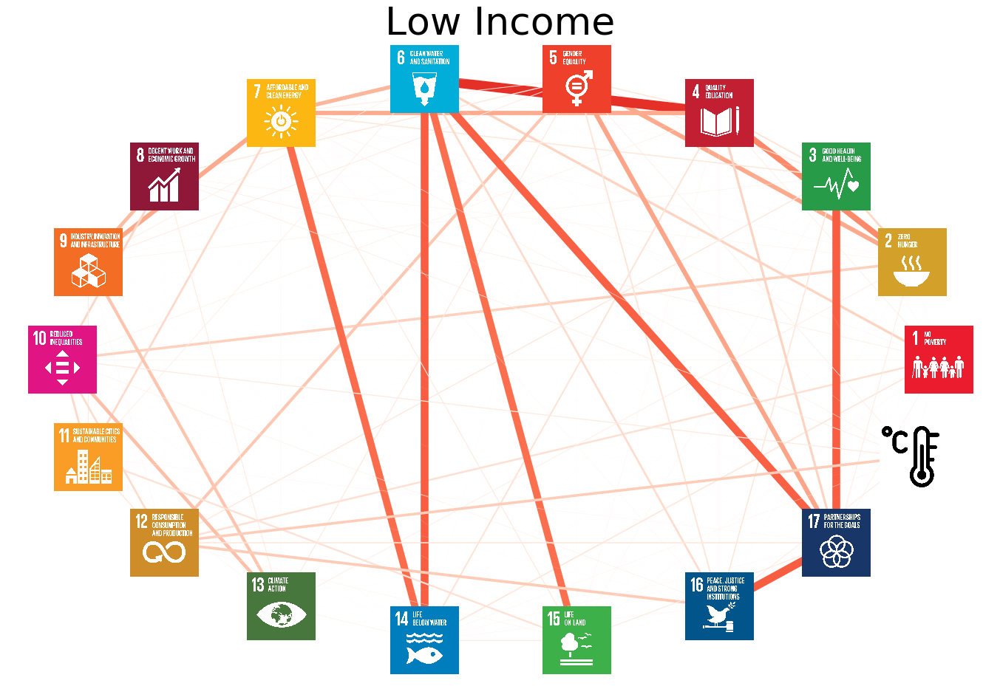

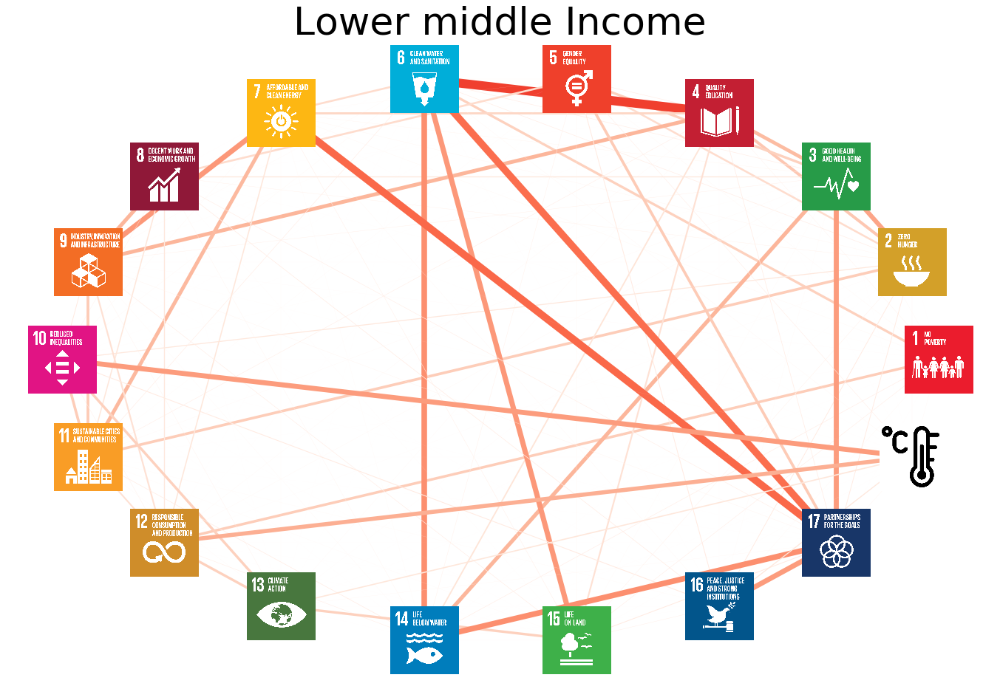

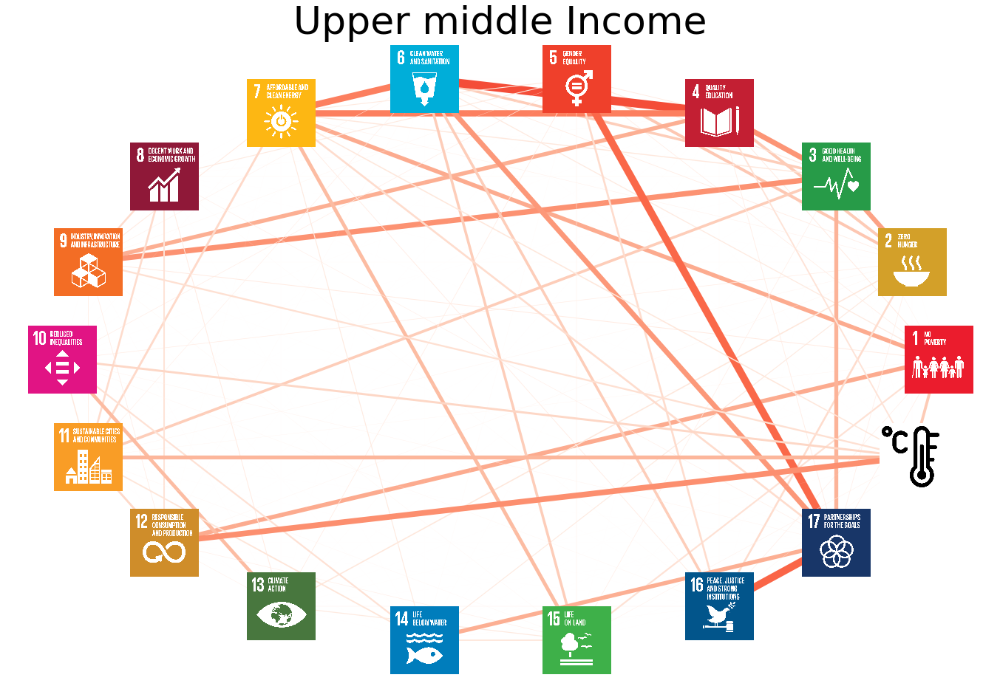

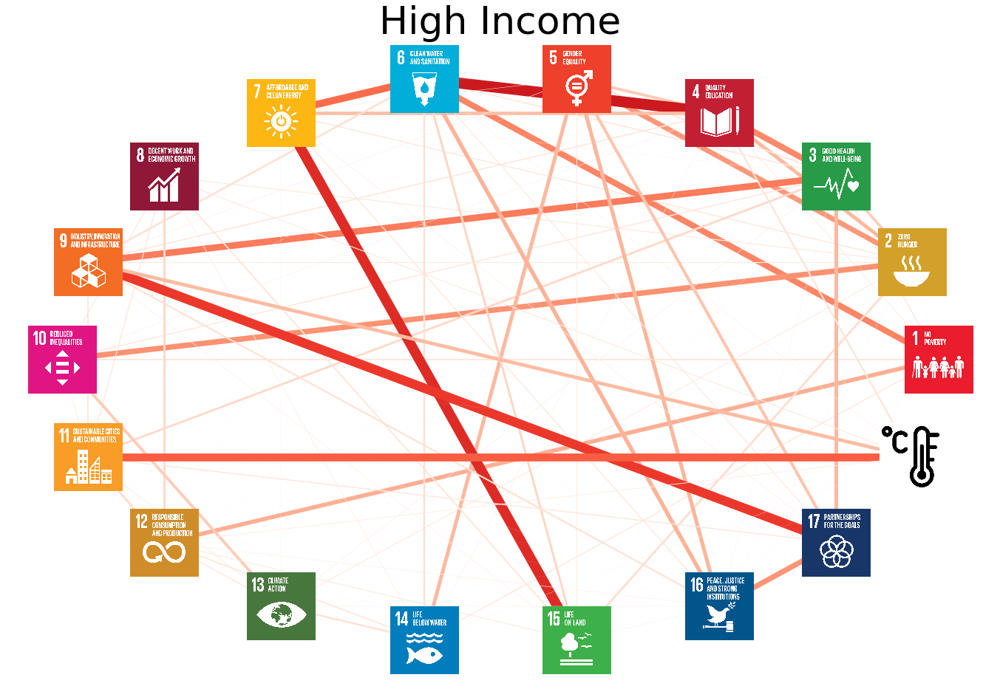

In [70]:
# plotting networks with weighted edges

centrality_G = {}
density_G = {}

for group in cor_goals_groups_2.keys():
    G_G = nx.Graph()

    for key, value in dcor_dict_g[group].items():
        G_G.add_edge(int(key[0]), int(key[1]), weight=value, color=sns.color_palette("Reds", 100)[int(np.around(100*value))], alpha=value)
        
    pos = nx.circular_layout(G_G)
    
    plt.figure(figsize=(24,16))

    # nodes
    nx.draw_networkx_nodes(G_G, pos, node_size=1000)

    # labels
    nx.draw_networkx_labels(G_G, pos, font_size=46, font_family='sans-serif')

    nodes = G_G.nodes()
    edges = G_G.edges()
    colors = [G_G[u][v]['color'] for u,v in edges]
    weights = [G_G[u][v]['weight'] for u,v in edges]

    nx.draw_networkx(G_G, pos, with_labels=False, edges=edges, edge_color=colors, node_color='white', node_size=1000, width=np.multiply(weights,20))

    ax=plt.gca()
    fig=plt.gcf()
    trans = ax.transData.transform
    trans_axes = fig.transFigure.inverted().transform
    imsize = 0.08    # this is the image size
    plt.title('{}'.format(group), fontdict={'fontsize': 52})

    for node in G_G.nodes():
        (x,y) = pos[node]   
        xx,yy = trans((x,y)) # figure coordinates
        xa,ya = trans_axes((xx,yy)) # axes coordinates
        a = plt.axes([xa-imsize/2.0,ya-imsize/2.0, imsize, imsize])
        a.imshow(mpimg.imread('utils/images/E_SDG goals_icons-individual-rgb-{}.png'.format(node)))
        a.axis('off')


    plt.axis('off')
    ax.axis('off')
    
    plt.savefig('distance_cor/goals/{}_circular_network_logos.png'.format(group), format='png')

    plt.show()
    
    # centrality
    centr = nx.eigenvector_centrality(G_G, weight='weight')
    centrality_G[group] = sorted((v, '{:0.2f}'.format(c)) for v, c in centr.items())
    
    # weighted density
    density_G[group] = 2 * np.sum(weights) / (len(nodes) * (len(nodes) - 1))

In [71]:
for group in groups:
    print(group)
    print(centrality_G[group])
    print('-------------------------')

Global North
[(1, '0.18'), (2, '0.23'), (3, '0.32'), (4, '0.40'), (5, '0.21'), (6, '0.43'), (7, '0.27'), (8, '0.06'), (9, '0.33'), (10, '0.10'), (11, '0.17'), (12, '0.07'), (13, '0.06'), (14, '0.08'), (15, '0.20'), (16, '0.22'), (17, '0.29'), (18, '0.11')]
-------------------------
Global South
[(1, '0.10'), (2, '0.17'), (3, '0.26'), (4, '0.42'), (5, '0.18'), (6, '0.48'), (7, '0.38'), (8, '0.05'), (9, '0.12'), (10, '0.06'), (11, '0.12'), (12, '0.04'), (13, '0.02'), (14, '0.18'), (15, '0.25'), (16, '0.18'), (17, '0.37'), (18, '0.05')]
-------------------------
Least Developed Countries (LDC)
[(1, '0.08'), (2, '0.16'), (3, '0.24'), (4, '0.40'), (5, '0.19'), (6, '0.51'), (7, '0.24'), (8, '0.05'), (9, '0.07'), (10, '0.05'), (11, '0.12'), (12, '0.08'), (13, '0.04'), (14, '0.31'), (15, '0.25'), (16, '0.20'), (17, '0.40'), (18, '0.04')]
-------------------------
Land Locked Developing Countries (LLDC)
[(1, '0.10'), (2, '0.15'), (3, '0.24'), (4, '0.43'), (5, '0.17'), (6, '0.55'), (7, '0.26'), 

In [72]:
for group in groups:
    print(group)
    print(density_G[group])
    print('-------------------------')

Global North
0.07842649838648673
-------------------------
Global South
0.07356577766853194
-------------------------
Least Developed Countries (LDC)
0.07379007623988709
-------------------------
Land Locked Developing Countries (LLDC)
0.06989038921964087
-------------------------
Small Island Developing States (SIDS)
0.075497895458899
-------------------------
G20
0.0749365333434409
-------------------------
Emerging Markets (BRICS + N-11)
0.07028277617052137
-------------------------
OPEC
0.07196670088846417
-------------------------
Low Income
0.07197925902115332
-------------------------
Lower middle Income
0.06962099376166346
-------------------------
Upper middle Income
0.0746542640731384
-------------------------
High Income
0.07870493543559658
-------------------------


### 2. Maximum dcor on target-level equal to goal-level dcor

Since it could happen that there are very strong dependencies between two targets of two different goals, but the dependency over all targets of two goals is small, we take additionally the highest distance correlation between any two targets of two goals as the distance correlation between these two goals. 

In [ ]:
max_dcor = {}
                  
for continent in continents:
    max_dcor[continent] = pd.DataFrame(index=goals, columns=goals)
    
    for goalcombination in goalcombinations:
        max_dcor[continent].loc[goalcombination[1], goalcombination[0]] = 0
        
        for target_0 in dict_goals[goalcombination[0]]:
            for target_1 in dict_goals[goalcombination[1]]:
                
                dcor = cor_targets_continents_2[continent].loc[target_1, target_0]
                if dcor > max_dcor[continent].loc[goalcombination[1], goalcombination[0]]:
                    max_dcor[continent].loc[goalcombination[1], goalcombination[0]] = dcor
                    
for group in groups:
    max_dcor[group] = pd.DataFrame(index=goals, columns=goals)
    
    for goalcombination in goalcombinations:
        max_dcor[group].loc[goalcombination[1], goalcombination[0]] = 0
        
        for target_0 in dict_goals[goalcombination[0]]:
            for target_1 in dict_goals[goalcombination[1]]:
                
                dcor = cor_targets_continents_2[group].loc[target_1, target_0]
                if dcor > max_dcor[group].loc[goalcombination[1], goalcombination[0]]:
                    max_dcor[group].loc[goalcombination[1], goalcombination[0]] = dcor

In [ ]:
# check
max_dcor['Europe']

In [ ]:
# better save these precious data
g_cor = open('distance_cor/goals/dcor_goals_max.pkl', 'wb')
pickle.dump(max_dcor, g_cor)
g_cor.close()

## Visualisation on goal-level
Additionally to the matrices with numbers, we would also like to visualise these matrices and plot these correlations as networks.

In [ ]:
# continents
for continent in continents:
    # generate a mask for the upper triangle
    mask = np.zeros_like(max_dcor[continent].fillna(0), dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # set up the matplotlib figure
    f, ax = plt.subplots(figsize=(25, 22))

    # generate a custom diverging colormap
    cmap = sns.color_palette("Reds", 100)

    # draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(max_dcor[continent].fillna(0), mask=mask, cmap=cmap, vmax=1, center=0.5, vmin=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .8})
    
    plt.title('{}'.format(continent), fontdict={'fontsize': 52})
    plt.savefig('distance_cor/goals/{}_dcor_goals_max.png'.format(continent))

In [ ]:
# groups
for group in groups:
    # generate a mask for the upper triangle
    mask = np.zeros_like(max_dcor[group].fillna(0), dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # set up the matplotlib figure
    f, ax = plt.subplots(figsize=(25, 22))

    # generate a custom diverging colormap
    cmap = sns.color_palette("Reds", 100)

    # draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(max_dcor[group].fillna(0), mask=mask, cmap=cmap, vmax=1, center=0.5, vmin=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .8})
    
    plt.title('{}'.format(group), fontdict={'fontsize': 52})
    plt.savefig('distance_cor/goals/{}_dcor_goals_max.png'.format(group))

Additionally to these matrices we also plot the distance correlations as networks.

In [ ]:
# data preparation for networkX
max_dcor_dict = {}

for group in max_dcor.keys():
    max_dcor_dict[group] = {}

    for goalcombination in goalcombinations:
        max_dcor_dict[group][goalcombination] = max_dcor[group].loc[goalcombination[1], goalcombination[0]]

In [ ]:
# plotting networks with weighted edges

centrality_G = {}
density_G = {}

for group in max_dcor.keys():
    G_G = nx.Graph()

    for key, value in max_dcor_dict[group].items():
        G_G.add_edge(int(key[0]), int(key[1]), weight=value, color=sns.color_palette("Reds", 100)[int(np.around(100*value))], alpha=value)
        
    pos = nx.circular_layout(G_G)
    
    plt.figure(figsize=(24,16))

    # nodes
    nx.draw_networkx_nodes(G_G, pos, node_size=1000)

    # labels
    nx.draw_networkx_labels(G_G, pos, font_size=46, font_family='sans-serif')

    nodes = G_G.nodes()
    edges = G_G.edges()
    colors = [G_G[u][v]['color'] for u,v in edges]
    weights = [G_G[u][v]['weight'] for u,v in edges]

    nx.draw_networkx(G_G, pos, with_labels=False, edges=edges, edge_color=colors, node_color='white', node_size=1000, width=np.multiply(weights,20))

    ax=plt.gca()
    fig=plt.gcf()
    trans = ax.transData.transform
    trans_axes = fig.transFigure.inverted().transform
    imsize = 0.08    # this is the image size
    plt.title('{}'.format(group), fontdict={'fontsize': 52})

    for node in G_G.nodes():
        (x,y) = pos[node]   
        xx,yy = trans((x,y)) # figure coordinates
        xa,ya = trans_axes((xx,yy)) # axes coordinates
        a = plt.axes([xa-imsize/2.0,ya-imsize/2.0, imsize, imsize])
        a.imshow(mpimg.imread('utils/images/E_SDG goals_icons-individual-rgb-{}.png'.format(node)))
        a.axis('off')


    plt.axis('off')
    ax.axis('off')
    
    plt.savefig('distance_cor/goals/{}_circular_network_logos_max.png'.format(group), format='png')

    plt.show()
    
    # centrality
    centr = nx.eigenvector_centrality(G_G, weight='weight')
    centrality_G[group] = sorted((v, '{:0.2f}'.format(c)) for v, c in centr.items())
    
    # weighted density
    density_G[group] = 2 * np.sum(weights) / (len(nodes) * (len(nodes) - 1))

In [ ]:
for group in groups:
    print(group)
    print(centrality_G[group])
    print('-------------------------')

In [ ]:
for group in groups:
    print(group)
    print(density_G[group])
    print('-------------------------')